In [1]:
import os
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import numpy as np
import h5py
from oasis.functions import deconvolve
from oasis import oasisAR1, oasisAR2
import pyute as ut

from importlib import reload
reload(ut)
import scipy.ndimage.filters as sfi
import scipy.stats as sst
import scipy.ndimage.measurements as snm
from mpl_toolkits.mplot3d import Axes3D
import scipy.optimize as sop
import pdb
import size_contrast_analysis as sca
reload(sca)
import retinotopy_analysis as rt
reload(rt)
import pickle as pkl

/home/mossing/Documents/code/downloads/OASIS/oasis/functions.py:13: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  warn("Could not find cvxpy. Don't worry, you can still use OASIS, " +


In [2]:
folds = []
files = []
rets = []
adjust_fns = []
rgs = []
criteria = []
datafoldbases = []

def tack_on(thisfold,thisfile,retnumber,frame_adjust=None,rg=(1,0),criterion=lambda x: np.abs(x)>100,datafoldbase='/home/mossing/scratch/2Pdata/'):
    folds.append(thisfold)
    files.append(thisfile)
    rets.append(retnumber)
    adjust_fns.append(frame_adjust)
    rgs.append(rg)
    criteria.append(criterion)
    datafoldbases.append(datafoldbase)

thisfold = '180713/M9053/'
thisfile = 'M9053_125_002'
retnumber = '001'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/') 

thisfold = '180714/M9053/'
thisfile = 'M9053_140_004'
retnumber = '003'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/')

thisfold = '180802/M9053/'
thisfile = 'M9053_135_003'
retnumber = '002'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/')

thisfold = '180821/M9417/'
thisfile = 'M9417_140_005'
retnumber = '006'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/')

thisfold = '181117/M10039/'
thisfile = 'M10039_150_003'
retnumber = '002'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/')

thisfold = '181120/M10039/'
thisfile = 'M10039_140_006'
retnumber = '005'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/')

thisfold = '181121/M10039/'
thisfile = 'M10039_135_005'
retnumber = '004'
tack_on(thisfold,thisfile,retnumber,datafoldbase='/media/mossing/backup_1/data/2P/')

In [3]:
procname = 'procfiles/sst_size_contrast_proc.hdf5'
dsname = '../shared_data/sst_l23_data_struct.hdf5'

In [13]:
if os.path.exists(procname):
    os.remove(procname)
if os.path.exists(dsname):
    os.remove(dsname)
import analysis_template as at
reload(at)
reload(sca)
keylist = sca.analyze_simply(folds,files,rets,adjust_fns,rgs,datafoldbase=datafoldbases,stimfoldbase='/home/mossing/modulation/visual_stim/',procname=procname)
with h5py.File(procname,mode='r') as proc:
    grouplist = sca.add_data_struct_h5_simply(dsname,cell_type='Sst', keylist=keylist, frame_rate_dict=None, proc=proc, nbefore=8, nafter=8)

/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_000.rois
(35, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_001.rois
(54, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_002.rois
(65, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_003.rois
(58, 9474)
no mean image data for /home/mossing/modulation/visual_stim/180713/M9053/M9053_125_002.mat
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_000.rois
(61, 10010)
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_001.rois
(76, 10010)
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_002.rois
(81, 10010)
roi 40 all zeros
roi 41 all zeros
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_003.rois
(82, 10009)
no mean image data for /home/mossing/modulation/visual_stim/180714/M9053/M9053_140_004.mat
problem with trial #177
problem with trial #178
problem with trial #179
problem with trial #177
prob

In [10]:
pdb.pm()

> /home/mossing/Documents/code/adesnal/analysis_template.py(52)analyze()
-> assert(True==False)
(Pdb) dxdt.shape
(37779, 1)
(Pdb) pupil_area.shape
(1, 18949)
(Pdb) pupil_ctr.shape
(2, 18949)
(Pdb) exit


In [35]:
reload(sca)
with h5py.File(procname,mode='r') as proc:
    featurenames = ['size','contrast','angle']
    key = list(proc.keys())[0]
#     print(proc[key]['size'][:])
    stim_params = sca.size_contrast_params_kludge()
    stimfile = '/home/mossing/modulation/visual_stim/180713/M9053/M9053_125_002.mat'
    
    result = ut.loadmat(stimfile,'result')[()]
    
    name = [None]*len(stim_params)
    function = [None]*len(stim_params)
#     print(stim_params)
    for iparam,param in enumerate(stim_params):
        name[iparam],function[iparam] = param
        print(name[iparam])
        print(function[iparam](result))
    
    paramlist = [('angle','Orientation'),('size','Size'),('contrast','Contrast')]
    params_and_fns = [None]*len(paramlist)
    param = [None]*len(paramlist)
    function = [None]*len(paramlist)
    for i,pair in enumerate(paramlist):
#         print(pair[1])
        param[i] = pair[0]
        label = pair[1]
#         print(label)
        function[i] = lambda result: result['gratingInfo'][()][label][()] #label=
#         print(function[i](result))
#         if i>0:
#             print(function[i-1](result))
        params_and_fns[i] = (param[i],function[i])
    
    stim_params = params_and_fns.copy()
#     print(stim_params)
    
    name = [None]*len(stim_params)
    function = [None]*len(stim_params)
    for iparam,param in enumerate(stim_params):
#         print(param)
        name[iparam],function[iparam] = param
#         print(name[iparam])
#         print(function[iparam](result)) # (result)

angle
[315 135  90 ... 315  90 270]
size
[36.5        13.50925609  8.21865442 ...  5.         13.50925609
 36.5       ]
contrast
[0.5  0.25 0.25 ... 0.12 0.12 0.  ]


In [39]:
with h5py.File(dsname,mode='r') as ds:
    key = list(ds.keys())[0]
    print([x for x in ds[key]['size_contrast_0'].keys()])
    print(ds[key]['size_contrast_0']['stimulus_id'][:])
    print(ds[key]['size_contrast_0']['F'].shape)

['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'raw_trialwise', 'rf_ctr', 'rf_displacement_deg', 'rf_distance_deg', 'rf_mapping_pval', 'running_speed_cm_s', 'stim_offset_deg', 'stimulus_contrast', 'stimulus_direction', 'stimulus_id', 'stimulus_size_deg', 't_offset']
[[4 2 1 ... 0 2 4]
 [4 3 3 ... 2 2 0]
 [7 3 2 ... 7 2 6]]
(212, 1200, 20)


In [23]:
with h5py.File(dsname,mode='r') as ds:
    keylist = [key for key in ds.keys()]
    ikey = 0
    print([key for key in ds[keylist[ikey]]['figure_ground_0'].keys()])
    print(ds[keylist[ikey]]['figure_ground_0']['stimulus_type'][:])

['F', 'decon', 'nafter', 'nbefore', 'neuropil_trialwise', 'pupil_area_trialwise_pix', 'pupil_ctr_trialwise_pix', 'raw_trialwise', 'running_speed_cm_s', 'stimulus_direction_deg', 'stimulus_id', 'stimulus_type', 't_offset']
[b'ctrl' b'fig' b'grnd' b'iso' b'cross']


In [15]:
grouplist

In [11]:
keylist

In [3]:
ret = {}
paramdict = {}
pval = {}
trialrun = {}
nbydepth = {}
spont = {}
soriavg = {}
strialavg = {}
lb = {}
ub = {}

In [9]:
reload(sca)

<module 'size_contrast_analysis' from '/home/mossing/Documents/code/adesnal/size_contrast_analysis.py'>

In [13]:
# reload(sca)
# if os.path.exists('sst_l23_size_contrast_proc.hdf5'):
#     os.remove('sst_l23_size_contrast_proc.hdf5')
if os.path.exists('sst_l23_data_struct.hdf5'):
    os.remove('sst_l23_data_struct.hdf5')

In [11]:
# soriavg,strialavg,lb,ub,pval,nbydepth,spont,ret = sca.analyze_everything(folds,files,rets,adjust_fns,rgs)
reload(sca)
# soriavg,strialavg,lb,ub,pval,nbydepth,spont,ret_vars,Smean_stat,proc = sca.analyze_everything_by_criterion(folds,files,rets,adjust_fns,rgs,criteria=criteria,datafoldbase=datafoldbases,stimfoldbase='/home/mossing/modulation/visual_stim/',criterion_cutoff=0.4)
soriavg,ret_vars = sca.analyze_everything_by_criterion(folds,files,rets,adjust_fns,rgs,criteria=criteria,datafoldbase=datafoldbases,stimfoldbase='/home/mossing/modulation/visual_stim/',criterion_cutoff=0.2,procname='sst_l23_size_contrast_proc.hdf5')

/media/mossing/backup_1/data/2P/180713/M9053/retinotopy_001.mat
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_000.rois
(35, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_001.rois
(54, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_002.rois
(65, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_003.rois
(58, 9474)
(212, 1200, 20)
0.819166666667
0


/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:155: RuntimeWarning: Mean of empty slice
  Smean_stat[:,i,j,k] = np.nanmean(data[:,stat],1)


1
2
3
0
45
90
135
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_000.rois
(35, 9474)


/home/mossing/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/home/mossing/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/home/mossing/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1818: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_001.rois
(54, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_002.rois
(65, 9474)
/media/mossing/backup_1/data/2P/180713/M9053/ot/M9053_125_002_ot_003.rois
(58, 9474)
(212, 1200, 20)
0.180833333333
loaded retinotopy file
/media/mossing/backup_1/data/2P/180714/M9053/retinotopy_003.mat
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_000.rois
(61, 10010)
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_001.rois
(76, 10010)
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_002.rois
(81, 10010)
roi 40 all zeros
roi 41 all zeros


/home/mossing/Documents/code/downloads/OASIS/oasis/functions.py:164: RuntimeWarning: invalid value encountered in multiply
  penalty=penalty, **kwargs)


/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_003.rois
(82, 10009)


/home/mossing/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2247: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


(300, 1200, 20)
0.8575
0
1
2
3
0
45
90
135
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_000.rois
(61, 10010)
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_001.rois
(76, 10010)
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_002.rois
(81, 10010)
roi 40 all zeros
roi 41 all zeros
/media/mossing/backup_1/data/2P/180714/M9053/ot/M9053_140_004_ot_003.rois
(82, 10009)
(300, 1200, 20)
0.1425
loaded retinotopy file
/media/mossing/backup_1/data/2P/180802/M9053/retinotopy_002.mat
/media/mossing/backup_1/data/2P/180802/M9053/ot/M9053_135_003_ot_000.rois
(42, 9491)
roi 23 all zeros
roi 24 all zeros
roi 27 all zeros
roi 37 all zeros
/media/mossing/backup_1/data/2P/180802/M9053/ot/M9053_135_003_ot_001.rois
(19, 9491)
roi 1 all zeros
roi 7 all zeros
roi 8 all zeros
roi 11 all zeros
roi 12 all zeros
roi 14 all zeros
roi 15 all zeros
/media/mossing/backup_1/data/2P/180802/M9053/ot/M9053_135_003_ot_002.rois
(18, 9491)
roi 2 all zeros
roi 4 all zero

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:150: RuntimeWarning: Mean of empty slice
  Smean[:,i,j,k,:] = np.nanmean(data[:,lkat,:],1)
/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:151: RuntimeWarning: Mean of empty slice
  Fmean[:,i,j,k,:] = np.nanmean(data_dfof[:,lkat,:],1)


3
0
45
90
135
/media/mossing/backup_1/data/2P/180821/M9417/ot/M9417_140_005_ot_000.rois
(46, 10581)


/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:180: RuntimeWarning: Mean of empty slice
  Savg = np.nanmean(np.nanmean(Smean[:,:,:,:,nbefore:-nafter],axis=-1),axis=1)
/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:181: RuntimeWarning: Mean of empty slice
  Favg = np.nanmean(np.nanmean(Fmean[:,:,:,:,nbefore:-nafter],axis=-1),axis=1)
/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:192: RuntimeWarning: Mean of empty slice.
  spont = spont + Sspont[key].mean(1)/nkeys
/home/mossing/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


roi 1 all zeros
roi 2 all zeros
roi 4 all zeros
roi 8 all zeros
roi 13 all zeros
roi 20 all zeros
roi 21 all zeros
roi 22 all zeros
roi 23 all zeros
roi 29 all zeros
roi 31 all zeros
roi 43 all zeros
roi 45 all zeros
/media/mossing/backup_1/data/2P/180821/M9417/ot/M9417_140_005_ot_001.rois
(29, 10581)
roi 3 all zeros
roi 4 all zeros
roi 5 all zeros
roi 6 all zeros
roi 8 all zeros
roi 9 all zeros
roi 14 all zeros
roi 15 all zeros
roi 18 all zeros
roi 21 all zeros
roi 24 all zeros
roi 26 all zeros
roi 28 all zeros
/media/mossing/backup_1/data/2P/180821/M9417/ot/M9417_140_005_ot_002.rois
(52, 10581)
roi 0 all zeros
roi 1 all zeros
roi 4 all zeros
roi 7 all zeros
roi 9 all zeros
roi 22 all zeros
/media/mossing/backup_1/data/2P/180821/M9417/ot/M9417_140_005_ot_003.rois
(26, 10580)
roi 9 all zeros
(153, 1200, 20)
0.780833333333
0
1
2
3
0
45
90
135
loaded retinotopy file
/media/mossing/backup_1/data/2P/181117/M10039/retinotopy_002.mat
/media/mossing/backup_1/data/2P/181117/M10039/ot/M10039_15

In [14]:
reload(sca)
with h5py.File('sst_l23_size_contrast_proc.hdf5',mode='r') as proc:
    keylist = list([x for x in proc.keys() if not x[0]=='_'])
#     print([key for key in proc[keylist[0]]['ret_vars'].keys()])
#     key = keylist[0]
#     print(proc[key]['ret_vars']['paramdict_normal']['xo'])
#     print([key for key in proc[keylist[0]].keys()])
    sca.add_data_struct_h5('sst_l23_data_struct.hdf5',cell_type='Sst', keylist=keylist, frame_rate_dict=None, proc=proc, nbefore=8, nafter=8)

In [6]:
pdb.pm()

> /home/mossing/Documents/code/adesnal/size_contrast_analysis.py(85)analyze_size_contrast()
-> zstrialwise = sst.zscore(strialwise.reshape((strialwise.shape[0],-1)).T).T.reshape(strialwise.shape)
(Pdb) strialwise.shape
(0,)
(Pdb) datafiles
[]
(Pdb) u
> /home/mossing/Documents/code/adesnal/size_contrast_analysis.py(424)analyze_everything_by_criterion()
-> soriavg[thisfold][k],_,_,_,_,_,_,proc[thisfold][k] = analyze_size_contrast(datafiles,stimfile,retfile,frame_adjust=frame_adjust,rg=rg,nbefore=nbefore,nafter=nafter,criterion=thesecriteria[k],criterion_cutoff=criterion_cutoff) # changed 2/12/19
(Pdb) datafiles
[]
(Pdb) exit


In [10]:
reload(sca)
keylist = list(soriavg.keys())
data_struct = sca.gen_full_data_struct(cell_type='Sst',keylist=keylist, proc=proc, ret_vars=ret_vars)

In [11]:
sio.savemat('sst_full_data_struct.mat',data_struct)

In [27]:
keylist = list(soriavg.keys())

In [11]:
for key in keylist:
    print(ret_vars[key]['position'])

[0 0]
[0 0]
[-10   0]
[-8 -8]
[-8  0]
[ 8 -8]
[0 0]


In [12]:
ontarget = {}
for key in keylist:
    ontarget[key] = np.nanmin(pval[key],axis=1)<0.05/(np.logical_not(np.isnan(pval[key][0])).sum())
    print(ontarget[key].sum())

AxisError: axis 1 is out of bounds for array of dimension 1

In [11]:
ontarget_ret_lax = {}
for key in keylist:
    pos = ret_vars[key]['position']
    ontarget_ret_lax[key],_ = rt.ontarget_by_retinotopy(ret_vars[key],ctr=pos,rg=10)

/home/mossing/Documents/code/adesnal/retinotopy_analysis.py:271: RuntimeWarning: invalid value encountered in less
  return np.logical_and((xo+ctr_ret[0]-ctr[0])**2+(-yo+ctr_ret[1]-ctr[1])**2<rg**2,pval_ret<pcutoff),np.hstack((xo,yo)) # ctr_ret as calculated assumes upside down retinotopy center; true through 18/10/30. Grid used in fitting gaussians goes from negative to positive degrees with increasing y index, hence -yo.


In [14]:
for key in keylist:
    print(ontarget_ret_lax[key].sum())

67
38
77
51
54
37
46


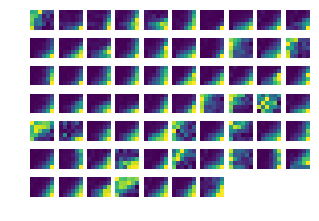

In [12]:
k = 0
ut.imshow_in_rows(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]])

In [31]:
data_struct[session_id].keys()

dict_keys(['mouse_id', 'stimulus_id', 'stimulus_size_deg', 'stimulus_contrast', 'stimulus_direction', 'cell_id', 'cell_type', 'calcium_responses_au', 'decon', 'rf_mapping_pval', 'rf_distance_deg', 'running_speed_cm_s'])

In [39]:
k = 0
keylist2 = ['session_'+s[:-1].replace('/','_') for s in keylist]
session_id = keylist2[k]
running = data_struct[session_id]['running_speed_cm_s']>10
nsize = len(data_struct[session_id]['stimulus_size_deg'])
ncontrast = len(data_struct[session_id]['stimulus_contrast'])
nangle = len(data_struct[session_id]['stimulus_direction'])
gd_roi = np.logical_and(data_struct[session_id]['rf_distance_deg']<10,data_struct[session_id]['rf_mapping_pval']<0.05)
strialavg = np.zeros((gd_roi.sum(),nsize,ncontrast,nangle))
for i in range(nsize):
    for j in range(ncontrast):
        for k in range(nangle):
            size_id = data_struct[session_id]['stimulus_id'][0]
            contrast_id = data_struct[session_id]['stimulus_id'][1]
            angle_id = data_struct[session_id]['stimulus_id'][2]
            gd_trial = np.logical_and(running,np.logical_and(angle_id==k,np.logical_and(size_id==i,contrast_id==j)))
            strialavg[:,i,j,k] = np.nanmean(data_struct[session_id]['decon'][gd_roi][:,gd_trial],1)

In [57]:
def symmetrize(arr):
    return np.concatenate((arr,arr[0:1]))

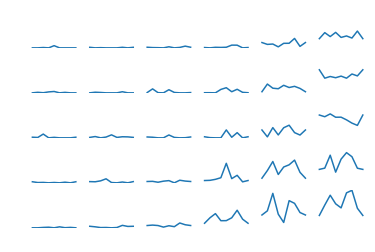

In [59]:
ind = 5
plt.figure()
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        plt.plot(symmetrize(strialavg[ind,i,j]))
        plt.ylim(strialavg[ind].min(),strialavg[ind].max())
        plt.axis('off')

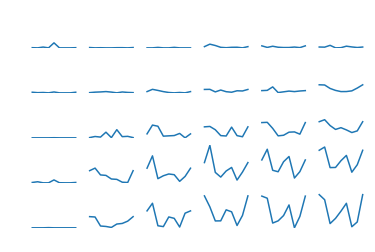

In [58]:
ind = 7
plt.figure()
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        plt.plot(symmetrize(strialavg[ind,i,j]))
        plt.ylim(strialavg[ind].min(),strialavg[ind].max())
        plt.axis('off')

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in double_scalars
  """


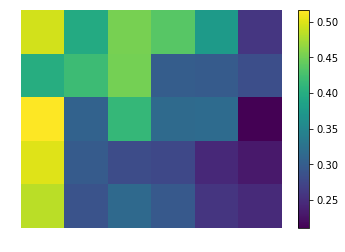

In [95]:
def compute_osi(r):
    theta = np.arange(0,2*np.pi,np.pi/4)
    x = np.nansum(np.cos(2*theta)*r)
    y = np.nansum(np.sin(2*theta)*r)
    return np.sqrt(x**2+y**2)/np.nansum(r)

osi = np.zeros(strialavg.shape[:-1])
for i in range(osi.shape[0]):
    for j in range(osi.shape[1]):
        for k in range(osi.shape[2]):
            osi[i,j,k] = compute_osi(strialavg[i,j,k])

plt.figure()
plt.imshow(np.nanmean(osi,0))
plt.colorbar()
plt.axis('off')
plt.savefig('osi_size_contrast_sst.png')

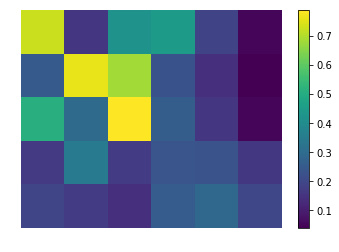

In [93]:
plt.imshow(osi[5])
plt.colorbar()
plt.axis('off')
plt.savefig('sst_osi_5.png')

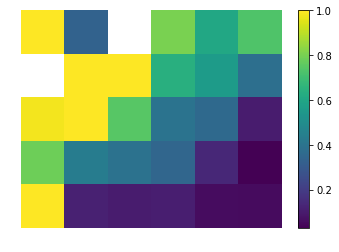

In [94]:
plt.imshow(osi[29])
plt.colorbar()
plt.axis('off')
plt.savefig('sst_osi_29.png')

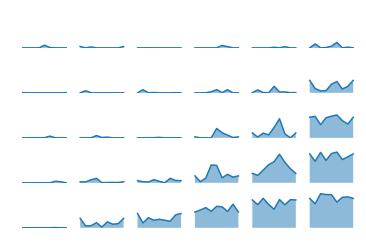

In [79]:
ind = 13
plt.figure()
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        plt.fill_between(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]),alpha=0.5)
        plt.plot(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]))
        plt.ylim(strialavg[ind].min(),1.1*strialavg[ind].max())
        plt.axis('off')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


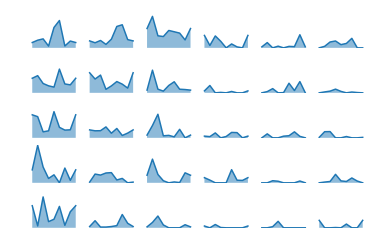

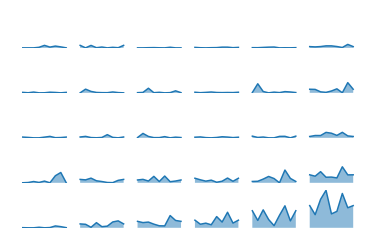

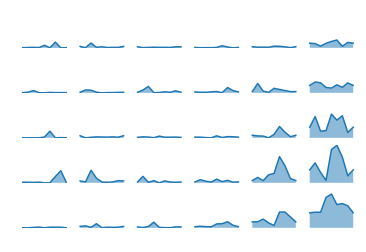

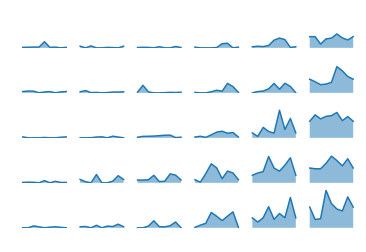

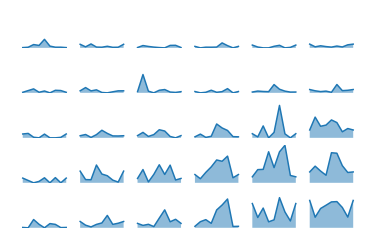

...

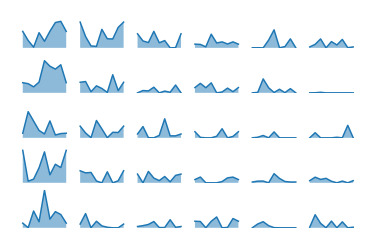

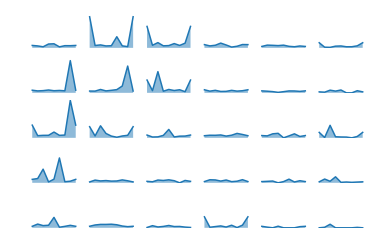

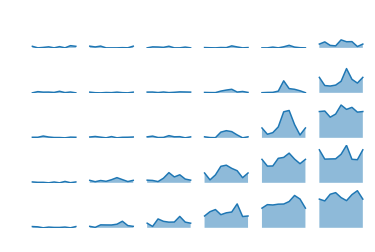

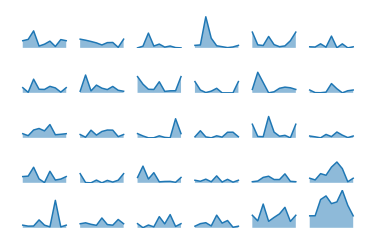

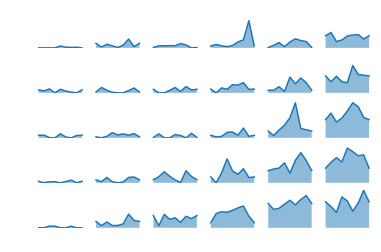

In [80]:
ind = 15
# os.mkdir('sst_ori_tuning_size_contrast')
for ind in range(strialavg.shape[0]):
    plt.figure()
    for i in range(nsize):
        for j in range(ncontrast):
            plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
            plt.fill_between(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]),alpha=0.5)
            plt.plot(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]))
            plt.ylim(strialavg[ind].min(),strialavg[ind].max())
            plt.axis('off')
    plt.savefig('sst_ori_tuning_size_contrast/%02d.png' % ind)

In [30]:
k = 0
plt.figure(figsize=(5,70))
L = ontarget_ret_lax[keylist[k]].sum()
for ind in range(L):
    data = strialavg[keylist2[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,:,:,nbefore:-nafter].mean(-1)
    plt.subplot(L,5,ind*5+1)
    plt.imshow(data.mean(0))
    plt.axis('off')
    for i in range(4):
        plt.subplot(L,5,ind*5+i+2)
        plt.imshow(data[i],vmax=data.max())
        plt.axis('off') 
# plt.savefig('size_contrast_tuning_by_ori.png')

KeyError: 'session_180713_M9053'

In [14]:
nbefore = 4
nafter = 4
proc[keylist[k]][0]['strialwise'][ontarget_ret_lax[keylist[k]]][:,:,nbefore:-nafter].shape

NameError: name 'nbefore' is not defined

In [29]:
os.mkdir('190125_figs/example_size_by_contrast/sst_ex2_animation/')

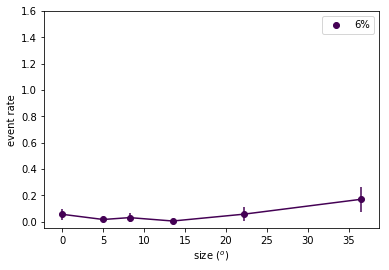

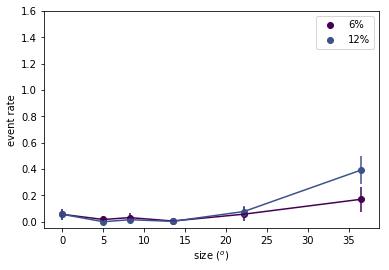

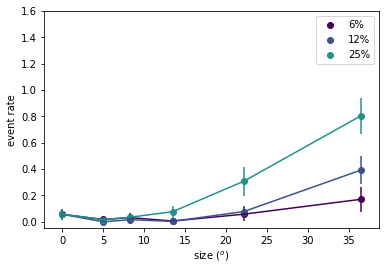

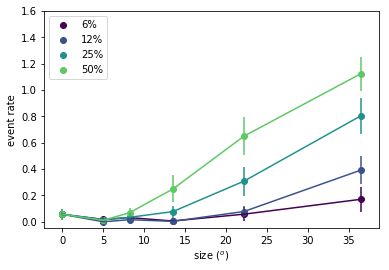

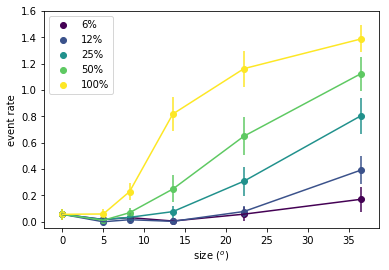

In [24]:
colors = plt.cm.viridis(np.linspace(0,1,5))
for cap in range(1,6):
    plt.figure()
    k = 0
#     ind = 80
    ind = 11
    mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,1:cap+1])
    lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,1:cap+1])
    ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,1:cap+1])
    ut.plot_errorbars_hillel(s0,mn_tgt.T,lb_tgt.T,ub_tgt.T,colors = colors[:cap])
    plt.ylabel('event rate')
    plt.xlabel('size ($^o$)')
    plt.legend([str(int(np.round(x)))+'%' for x in c[1:cap+1]])
    plt.ylim((-0.05,1.6))
    plt.savefig('190125_figs/example_size_by_contrast/sst_ex1_animation/sst_ex1_size_tuning'+str(cap-2)+'.pdf')

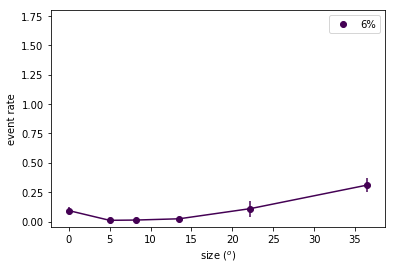

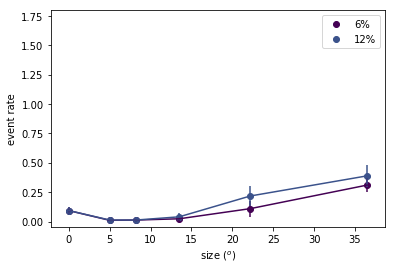

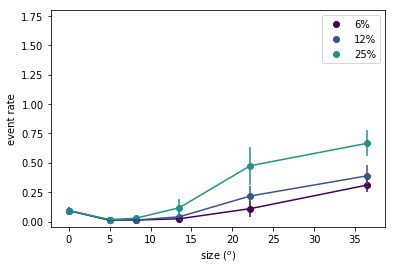

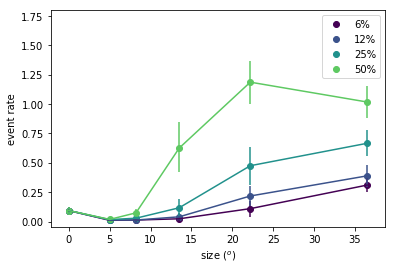

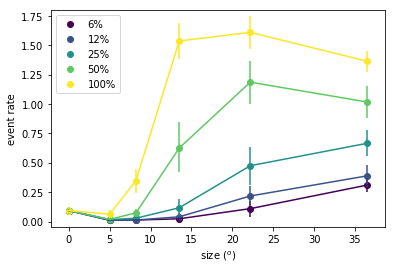

In [30]:
colors = plt.cm.viridis(np.linspace(0,1,5))
for cap in range(1,6):
    plt.figure()
    k = 0
#     ind = 80
    ind = 28
    mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,1:cap+1])
    lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,1:cap+1])
    ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,1:cap+1])
    ut.plot_errorbars_hillel(s0,mn_tgt.T,lb_tgt.T,ub_tgt.T,colors = colors[:cap])
    plt.ylabel('event rate')
    plt.xlabel('size ($^o$)')
    plt.legend([str(int(np.round(x)))+'%' for x in c[1:cap+1]])
    plt.ylim((-0.05,1.8))
    plt.savefig('190125_figs/example_size_by_contrast/sst_ex2_animation/sst_ex2_size_tuning'+str(cap-2)+'.pdf')

In [28]:
# on target based on size/contrast responses
ucontrast = {}
to_take_c = {}
intersect = np.array(())
for key in keylist:
    gdind = sca.find_gdind(soriavg[key])
    ucontrast[key] = np.unique(proc[key][gdind]['contrast'])
for key in keylist:
    if not intersect.size:
        intersect = ucontrast[key]
    else:
        intersect = np.intersect1d(intersect,ucontrast[key])
for key in keylist:
    to_take_c[key] = np.where(np.in1d(ucontrast[key],intersect))[0]
    
c = 100*intersect
    
usize = {}
to_take_s = {}
intersect = np.array(())
for key in keylist:
    gdind = sca.find_gdind(soriavg[key])
    usize[key] = np.unique(proc[key][gdind]['size'])
for key in keylist:
    if not intersect.size:
        intersect = usize[key]
    else:
        intersect = np.intersect1d(intersect,usize[key])
for key in keylist:
    to_take_s[key] = np.where(np.in1d(usize[key],intersect))[0]

s = intersect
s0 = np.concatenate(((0,),s))

snorm = sca.get_norm_curves_row_col(soriavg,ontarget_ret_lax,sizes=to_take_s,contrasts=to_take_c,append_gray=True)

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:323: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


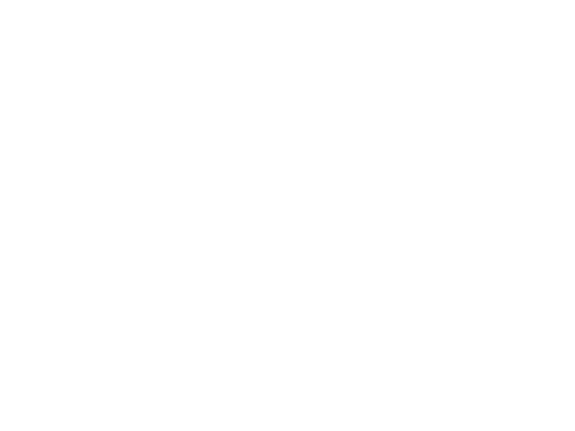

<IPython.core.display.Javascript object>


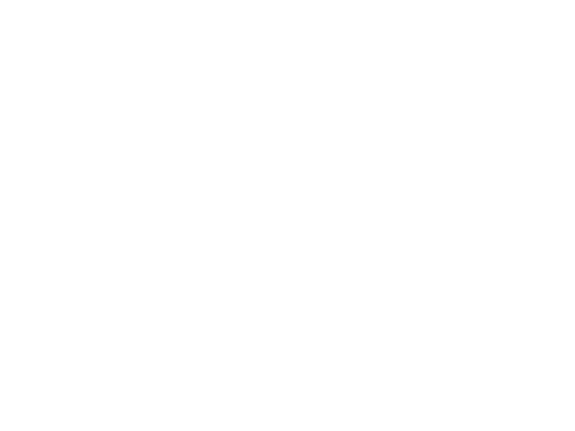

<IPython.core.display.Javascript object>


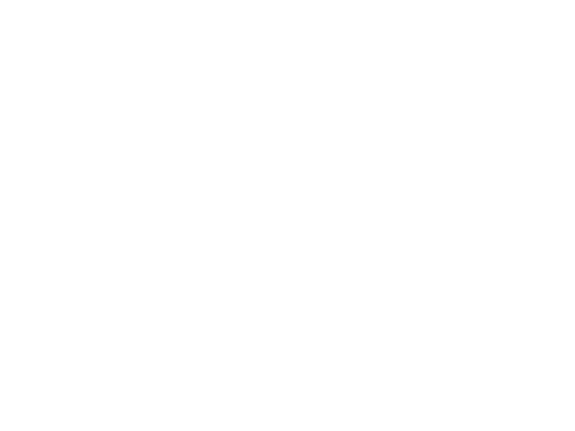

<IPython.core.display.Javascript object>


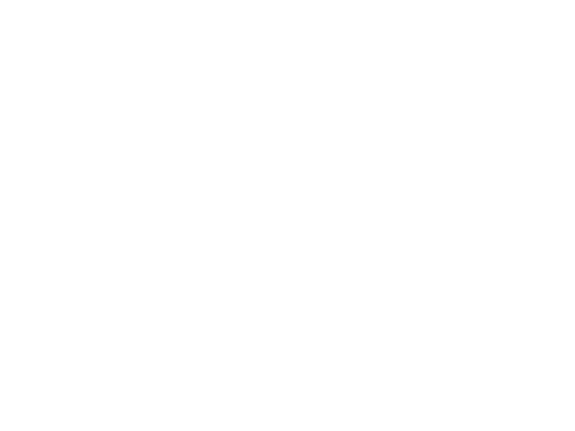

In [160]:
plt.figure()
ut.plot_bootstrapped_errorbars_hillel(c,snorm[0][:,1:])
plt.xlabel('contrast (%)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
plt.savefig('190125_figs/sst_contrast_by_size_190125_running_only.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(s0,snorm[0][:,:,1:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'%' for x in c[1:]])
plt.savefig('190125_figs/sst_size_by_contrast_190125_running_only.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(c,snorm[1][:,1:])
plt.xlabel('contrast (%)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
plt.savefig('190125_figs/sst_contrast_by_size_190125_non_running_only.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(s0,snorm[1][:,:,1:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'%' for x in c[1:]])
plt.savefig('190125_figs/sst_size_by_contrast_190125_non_running_only.pdf')

In [161]:
snorm[0].shape

(182, 6, 6)

In [162]:
import pickle as pkl
with open('sst_snorm_list.p', 'wb') as handle:
    pkl.dump(snorm, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [35]:
# tuning = np.zeros((0,5,6))
# started = False
# for k in (0,2):
#     if not started:
#         tuning = soriavg[keylist[k]][ontarget_ret_lax[keylist[k]]]
#         started = True
#     else:
#         tuning = np.concatenate((tuning,soriavg[keylist[k]][ontarget_ret_lax[keylist[k]]]),axis=0)
# axes = ['neuron','size','contrast']
# sizes = np.logspace(np.log10(5),np.log10(36.5),5)
# contrasts = np.array((0,0.06,0.12,0.25,0.5,1))*100
# sio.savemat('sst_size_contrast.mat',{'axes':axes,'sizes':sizes,'contrasts':contrasts,'tuning':tuning})

In [10]:
# def rf_info(k):
#     offset = ret_vars[keylist[k]]['paramdict_normal']['ctr'][()]*np.array((1,-1))-ret_vars[keylist[k]]['position']
#     shp = ret_vars[keylist[k]]['ret'].shape[1:3]
#     gridsize = ret_vars[keylist[k]]['paramdict_normal']['gridsize'][()]
#     Nx = shp[1]
#     Ny = shp[0]
#     xrg = offset[0] + np.arange(-(Nx-1)*gridsize/2,(Nx+1)*gridsize/2,gridsize)
#     yrg = offset[1] + np.arange((Ny-1)*gridsize/2,-(Ny+1)*gridsize/2,-gridsize)
#     print(offset)
#     print(xrg)
#     print(yrg)
#     if len(ret_vars[keylist[k]]['ret'].shape)>3:
#         rf = ret_vars[keylist[k]]['ret'][:,:,:,0]
#     else:
#         rf = ret_vars[keylist[k]]['ret']
#     return rf,xrg,yrg

# tuning = np.zeros((0,5,6))
# started = False
# for k in (0,2):
# #     print(soriavg[keylist[k]]) # [ontarget_ret_lax[keylist[k]]].shape)
#     n = soriavg[keylist[k]].shape[0]
#     rf,xrg,yrg = rf_info(k)
#     retinotopy_ = np.empty((n,),dtype='object')
#     xlocations_ = np.empty((n,),dtype='object')
#     ylocations_ = np.empty((n,),dtype='object')
#     for i in range(n):
#         retinotopy_[i] = rf[i]
#         xlocations_[i] = xrg
#         ylocations_[i] = yrg
#     expt_id_ = np.array([keylist[k]]*n,dtype='object')
#     if not started:
#         tuning = soriavg[keylist[k]] # [ontarget_ret_lax[keylist[k]]]
#         retinotopy = retinotopy_
#         xlocations = xlocations_
#         ylocations = ylocations_
#         expt_id = expt_id_
#         started = True
#     else:
#         tuning = np.concatenate((tuning,soriavg[keylist[k]]),axis=0) #[ontarget_ret_lax[keylist[k]]]
#         retinotopy = np.concatenate((retinotopy,retinotopy_),axis=0) #ret_vars[keylist[k]]['ret'][:,:,:,0]
#         xlocations = np.concatenate((xlocations,xlocations_),axis=0)
#         ylocations = np.concatenate((ylocations,ylocations_),axis=0)
#         expt_id = np.concatenate((expt_id,expt_id_),axis=0)
# axes = ['neuron','size','contrast']
# sizes = np.logspace(np.log10(5),np.log10(36.5),5)
# contrasts = np.array((0,0.06,0.12,0.25,0.5,1))*100
# sio.savemat('sst_size_contrast.mat',{'axes':axes,'sizes':sizes,'contrasts':contrasts,'tuning':tuning})

[ 0. -0.]
[-20. -15. -10.  -5.   0.   5.  10.  15.  20.]
[ 20.  15.  10.   5.   0.  -5. -10. -15. -20.]
[ 0. -0.]
[-20. -15. -10.  -5.   0.   5.  10.  15.  20.]
[ 20.  15.  10.   5.   0.  -5. -10. -15. -20.]


In [23]:
# def rf_info(k):
#     offset = ret_vars[keylist[k]]['paramdict_normal']['ctr'][()]*np.array((1,-1))-ret_vars[keylist[k]]['position']
#     shp = ret_vars[keylist[k]]['ret'].shape[1:3]
#     gridsize = ret_vars[keylist[k]]['paramdict_normal']['gridsize'][()]
#     Nx = shp[1]
#     Ny = shp[0]
#     xrg = offset[0] + np.arange(-(Nx-1)*gridsize/2,(Nx+1)*gridsize/2,gridsize)
#     yrg = offset[1] + np.arange(-(Ny-1)*gridsize/2,(Ny+1)*gridsize/2,gridsize)
#     print(offset)
#     print(xrg)
#     print(yrg)
#     if len(ret_vars[keylist[k]]['ret'].shape)>3:
#         rf = ret_vars[keylist[k]]['ret'][:,:,:,0]
#     else:
#         rf = ret_vars[keylist[k]]['ret']
#     return rf,xrg,yrg

# tuning = np.zeros((0,5,6))
# started = False
# for k in (0,2):
# #     print(soriavg[keylist[k]]) # [ontarget_ret_lax[keylist[k]]].shape)
#     n = soriavg[keylist[k]].shape[0]
#     rf,xrg,yrg = rf_info(k)
#     retinotopy_ = np.empty((n,),dtype='object')
#     xlocations_ = np.empty((n,),dtype='object')
#     ylocations_ = np.empty((n,),dtype='object')
#     for i in range(n):
#         retinotopy_[i] = rf[i]
#         xlocations_[i] = xrg
#         ylocations_[i] = yrg
#     expt_id_ = np.array([keylist[k]]*n,dtype='object')
#     if not started:
#         tuning = soriavg[keylist[k]] # [ontarget_ret_lax[keylist[k]]]
#         retinotopy = retinotopy_
#         xlocations = xlocations_
#         ylocations = ylocations_
#         expt_id = expt_id_
#         started = True
#     else:
#         tuning = np.concatenate((tuning,soriavg[keylist[k]]),axis=0) #[ontarget_ret_lax[keylist[k]]]
#         retinotopy = np.concatenate((retinotopy,retinotopy_),axis=0) #ret_vars[keylist[k]]['ret'][:,:,:,0]
#         xlocations = np.concatenate((xlocations,xlocations_),axis=0)
#         ylocations = np.concatenate((ylocations,ylocations_),axis=0)
#         expt_id = np.concatenate((expt_id,expt_id_),axis=0)
# axes = ['neuron','size','contrast']
# sizes = np.logspace(np.log10(5),np.log10(36.5),5)
# contrasts = np.array((0,0.06,0.12,0.25,0.5,1))*100
# # sio.savemat('sst_size_contrast.mat',{'axes':axes,'sizes':sizes,'contrasts':contrasts,'tuning':tuning,'rf':retinotopy,'rf_xlocations':xlocations,'rf_ylocations':ylocations,'expt_id':expt_id})

[ 0.  0.]
[-20. -15. -10.  -5.   0.   5.  10.  15.  20.]
[-20. -15. -10.  -5.   0.   5.  10.  15.  20.]
[ 0.  0.]
[-20. -15. -10.  -5.   0.   5.  10.  15.  20.]
[-20. -15. -10.  -5.   0.   5.  10.  15.  20.]


/home/mossing/Documents/code/adesnal/retinotopy_analysis.py:261: RuntimeWarning: invalid value encountered in less
  return np.logical_and((xo+ctr_ret[0]-ctr[0])**2+(-yo+ctr_ret[1]-ctr[1])**2<rg**2,pval_ret<pcutoff),np.hstack((xo,yo)) # assumes upside down retinotopy center; true through 18/10/30


<IPython.core.display.Javascript object>


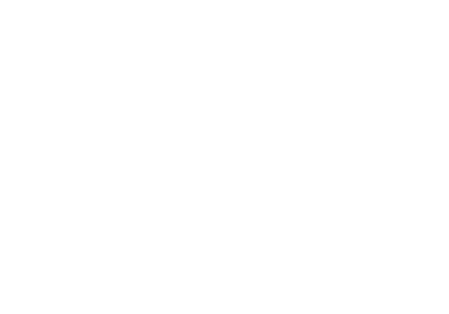

<IPython.core.display.Javascript object>


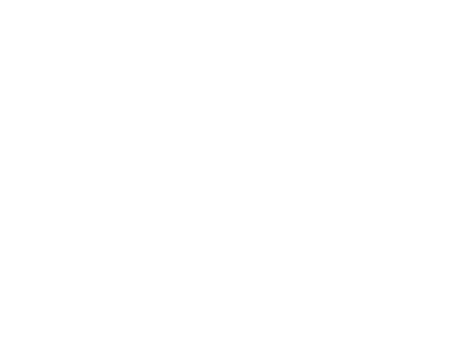

In [30]:

k = 0
ut.imshow_in_rows(ret_vars[keylist[k]]['ret'][ontarget_ret_lax[keylist[k]]])
w = np.where(ontarget_ret_lax[keylist[k]])[0]
ontarget_ret_lax[keylist[k]][w[np.array((3,10,11,13,21,22))]] = 0
k = 2
ut.imshow_in_rows(ret_vars[keylist[k]]['ret'][ontarget_ret_lax[keylist[k]]])
w = np.where(ontarget_ret_lax[keylist[k]])[0]
ontarget_ret_lax[keylist[k]][w[9]] = 0

<IPython.core.display.Javascript object>


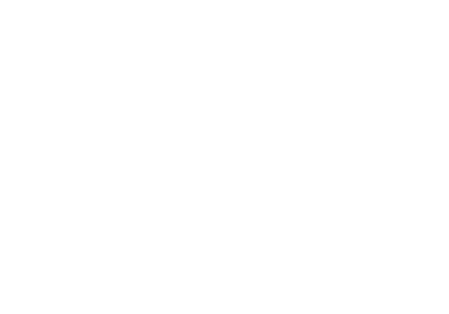

<IPython.core.display.Javascript object>


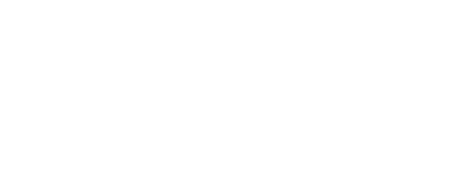

<IPython.core.display.Javascript object>


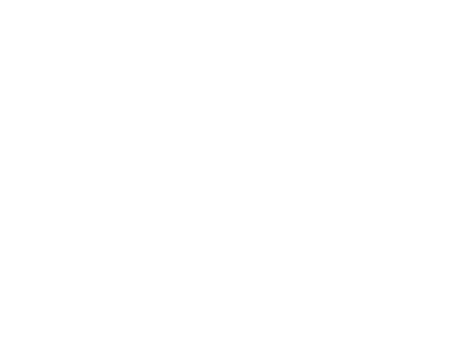

<IPython.core.display.Javascript object>


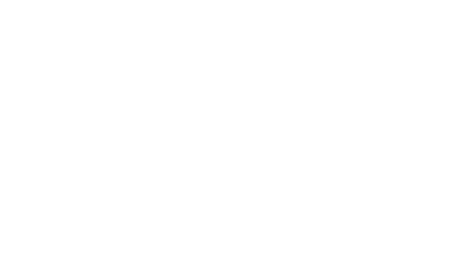

<IPython.core.display.Javascript object>


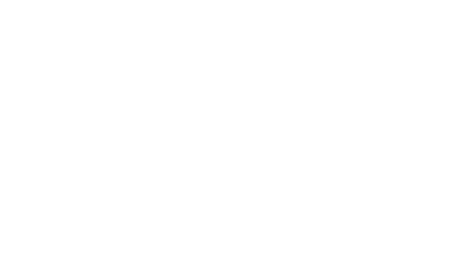

<IPython.core.display.Javascript object>


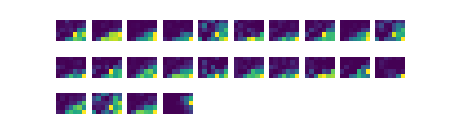

<IPython.core.display.Javascript object>


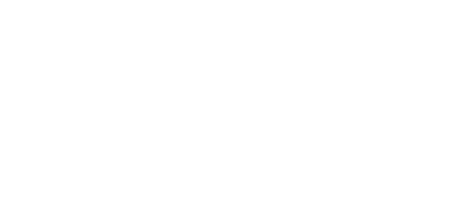

In [32]:
for k in range(len(keylist)):
    ut.imshow_in_rows(soriavg[keylist[k]][ontarget_ret_lax[keylist[k]]])

In [34]:
for key in ontarget_ret_lax.keys():
    print(ontarget_ret_lax[key].sum())
    print(soriavg[key].shape[1:])

61
(5, 6)
38
(5, 6)
76
(5, 6)
51
(5, 6)
54
(5, 7)
24
(5, 7)
46
(5, 7)


In [92]:
ucontrast = {}
to_take_c = {}
intersect = np.array(())
for key in keylist:
    ucontrast[key] = np.unique(proc[key]['contrast'])
for key in keylist:
    if not intersect.size:
        intersect = ucontrast[key]
    else:
        intersect = np.intersect1d(intersect,ucontrast[key])
for key in keylist:
    to_take_c[key] = np.where(np.in1d(ucontrast[key],intersect))[0]
    
c = 100*intersect
    
usize = {}
to_take_s = {}
intersect = np.array(())
for key in keylist:
    usize[key] = np.unique(proc[key]['size'])
for key in keylist:
    if not intersect.size:
        intersect = usize[key]
    else:
        intersect = np.intersect1d(intersect,usize[key])
for key in keylist:
    to_take_s[key] = np.where(np.in1d(usize[key],intersect))[0]

s = intersect
s0 = np.concatenate(((0,),s))

snorm = sca.get_norm_curves_row_col(soriavg,ontarget_ret_lax,sizes=to_take_s,contrasts=to_take_c,append_gray=True)

<IPython.core.display.Javascript object>


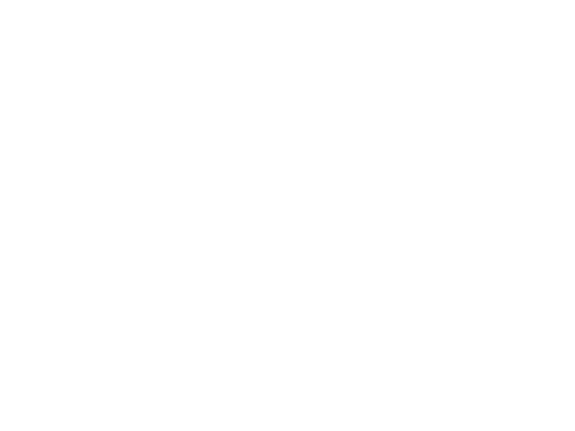

<IPython.core.display.Javascript object>


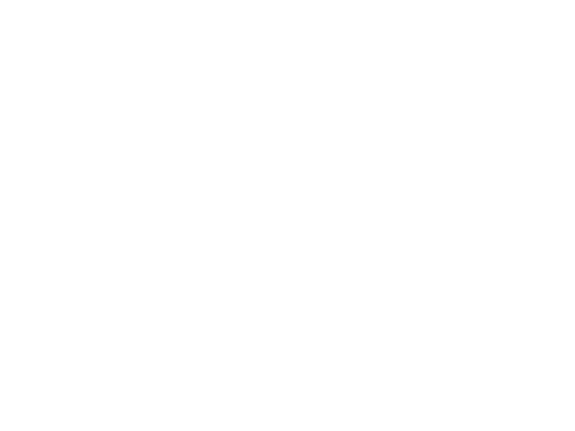

In [104]:
plt.figure()
ut.plot_bootstrapped_errorbars_hillel(c,snorm[:,1:])
plt.xlabel('contrast (%)')
plt.ylabel('event rate / max event rate')
plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
plt.savefig('190125_figs/sst_contrast_by_size_190125.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(s0,snorm[:,:,1:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.legend([str(int(np.round(x)))+'%' for x in c[1:]])
plt.savefig('190125_figs/sst_size_by_contrast_190125.pdf')

<IPython.core.display.Javascript object>


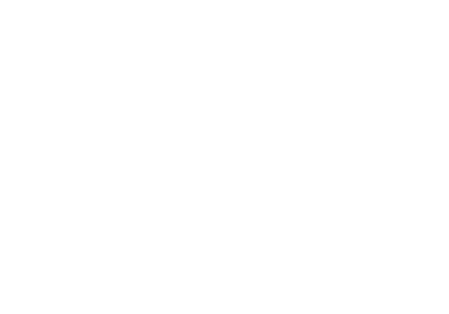

In [13]:
def do_three(x,mn,lb,ub,fn_outer,fn_inner):
    fn_outer(x,fn_inner(mn),fn_inner(lb),fn_inner(ub))
    
reload(ut)
s = np.array([5,8.2,13.5,22.2,36.5])

lbm = {}
ubm = {}
for key in keylist:
    lbm[key] = lb[key].mean(1)
    ubm[key] = ub[key].mean(1)

k = 2
lkat = ontarget_ret_lax[keylist[k]] #np.logical_and(ontarget[keylist[k]],ontarget_ret_lax[keylist[k]])
theserows = np.array((2,4))
# plt.plot(np.nanmean(strialavg[keylist[0]][ontarget_ret_strict][1],axis=0).mean(0).T)
fn_outer = ut.plot_errorbars_in_rows
fn_inner = lambda x: x[keylist[k]][lkat][:,:,theserows].transpose((0,2,1))
do_three(s,soriavg,lbm,ubm,fn_outer,fn_inner)
# ut.plot_errorbars_in_rows(s,soriavg[keylist[0]][lkat][:,:,theserows].transpose((0,2,1)),lb[keylist[0]][lkat][:,:,theserows].mean(1).transpose((0,2,1)),ub[keylist[0]][lkat][:,:,theserows].mean(1).transpose((0,2,1)))

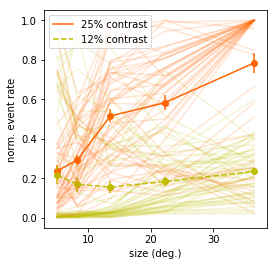

In [19]:
s = np.array([5,8.2,13.5,22.2,36.5])
theserows = np.array((2,5))
k = 0
lkat = ontarget_ret_lax[keylist[k]] #np.logical_and(ontarget[keylist[k]],ontarget_ret_lax[keylist[k]])
snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.nanmean,axis=0,pct=(16,84))

plt.figure(figsize=(4,4))
reload(ut)

# goldenrod = np.array((218,165,32))/255
goldenrod = np.array((255,100,0))/255

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c=goldenrod)
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,np.nanmean(snorm[lkat],axis=0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='y')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,np.nanmean(snorm[lkat],axis=0),lbmn,ubmn,fn_outer,fn_inner)

# # ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c=goldenrod)
plt.plot(30,0.5,linestyle='dashed',c='y')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.16,c='y')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.16,c=goldenrod)
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['25% contrast','12% contrast'])
# plt.savefig('sst_12_50_size_tuning_curves.pdf')
# plt.axis('tight')

In [55]:
lkatd = {}
for k in ((0,2)):
    lkatd[keylist[k]] = ontarget_ret_lax[keylist[k]]

In [56]:
nbefore = 4
nafter = 4

In [57]:
strialavg[keylist[k]][lkatd[keylist[k]]].shape

(67, 4, 5, 6, 12)

In [155]:
k = 0
thisproc = proc[keylist[k]]
thislkat = lkatd[keylist[k]]
def compute_sangle(thisproc,thislkat):
    strialwise = thisproc['strialwise'][thislkat]
    angle = thisproc['angle']
    size = thisproc['size']
    contrast = thisproc['contrast']
    trialrun = thisproc['trialrun']
    uangle = np.unique(angle)
    usize = np.unique(size)
    ucontrast = np.unique(contrast)
    sangle = np.zeros((thislkat.sum(),usize.size,uangle.size))
    sangle0 = np.zeros((thislkat.sum(),usize.size,uangle.size))
    for i in range(sangle.shape[1]):
        for j in range(sangle.shape[2]):
            thiscond = np.logical_and(trialrun,np.logical_and(np.in1d(contrast,ucontrast[-2:]),np.logical_and(angle==uangle[j],size==usize[i])))
            sangle0[:,i,j] = strialwise[:,thiscond,nbefore:-nafter][:,:1].mean(-1).mean(-1)
            sangle[:,i,j] = strialwise[:,thiscond,nbefore:-nafter][:,1:].mean(-1).mean(-1)
    return sangle,sangle0

In [156]:
sangle.shape

(66, 5, 8)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


<IPython.core.display.Javascript object>


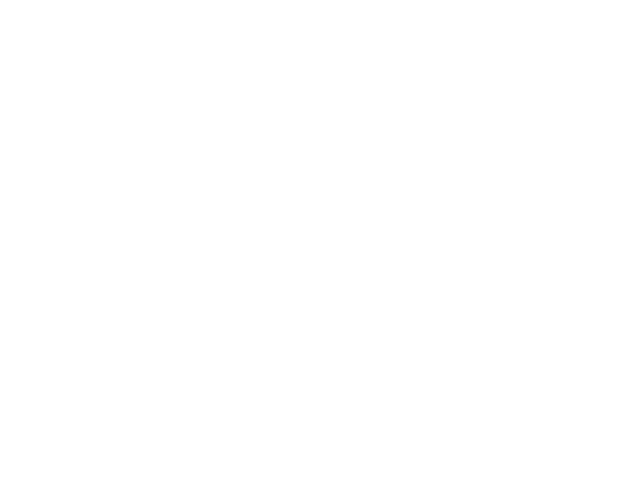

In [221]:
reload(sca)
sanglemax = {}
lkatd = {}
for k in ((0,1,2)):
    lkatd[keylist[k]] = np.logical_and(ret_vars[keylist[k]]['paramdict_normal']['amplitude'][()]>0,ontarget_ret_lax[keylist[k]])
def align_to_max(arr,arr0):
    arrc = np.zeros_like(arr[:,0,:])
    for i in range(arr.shape[0]):
        amy = np.argmax(arr[i].mean(-1))
        amx = np.argmax(arr0[i,amy])
        arrc[i] = np.roll(arr[i,amy],-amx)
    return arrc
def compute_sangle(thisproc,thislkat,slc=slice(-2,None)):
    strialwise = thisproc['strialwise'][thislkat]
    angle = thisproc['angle']
    size = thisproc['size']
    contrast = thisproc['contrast']
    trialrun = thisproc['trialrun']
    uangle = np.unique(angle)
    usize = np.unique(size)
    ucontrast = np.unique(contrast)
    sangle = np.zeros((thislkat.sum(),usize.size,uangle.size))
    sangle0 = np.zeros((thislkat.sum(),usize.size,uangle.size))
    for i in range(sangle.shape[1]):
        for j in range(sangle.shape[2]):
            thiscond = np.logical_and(trialrun,np.logical_and(np.in1d(contrast,ucontrast[slc]),np.logical_and(angle==uangle[j],size==usize[i])))
            sangle0[:,i,j] = strialwise[:,thiscond,4:-4][:,:1].mean(-1).mean(-1)
            sangle[:,i,j] = strialwise[:,thiscond,4:-4][:,1:].mean(-1).mean(-1)
    return sangle,sangle0

for k in (0,2):
    sangle,sangle0 = compute_sangle(proc[keylist[k]],lkatd[keylist[k]],slc=slice(-2,None))
    sanglemax[keylist[k]] = align_to_max(sangle,sangle0)-spont[keylist[k]][lkatd[keylist[k]]][:,np.newaxis]
snorm = np.vstack([val for val in sanglemax.values()])
snorm = np.roll(snorm,2,axis=1)
snorm = np.hstack((snorm,snorm[:,0:1]))/(snorm.max(1)[:,np.newaxis])
plt.figure()
plt.plot(0,0,c=np.array((1,0.8,0)))
lb,ub = ut.bootstrap(snorm,np.nanmean,axis=0,pct=(2.5,97.5))
ut.plot_errorbar_hillel(45*np.arange(9),np.nanmean(snorm,0),lb,ub,c=np.array((1,0.8,0)))
plt.ylim((0,1))
plt.legend(['SST high contrast'])

plt.ylabel('norm. evoked event rate')
plt.xlabel('direction (deg.)')

# for k in (0,2):
#     sangle,sangle0 = compute_sangle(proc[keylist[k]],lkatd[keylist[k]],slc=slice(1,4))
#     sanglemax[keylist[k]] = align_to_max(sangle,sangle0)-spont[keylist[k]][lkatd[keylist[k]]][:,np.newaxis]
# snorm = np.vstack([val for val in sanglemax.values()])
# snorm = np.roll(snorm,2,axis=1)
# snorm = np.hstack((snorm,snorm[:,0:1]))/(snorm.max(1)[:,np.newaxis])
# lb,ub = ut.bootstrap(snorm,np.nanmean,axis=0,pct=(2.5,97.5))
# ut.plot_errorbar_hillel(45*np.arange(9),np.nanmean(snorm,0),lb,ub,c=np.array((1,0.9,0.1)))
# plt.ylim((-0.2,1))

plt.savefig('sst_ori_tuning.pdf')
plt.savefig('sst_ori_tuning.eps')

<IPython.core.display.Javascript object>


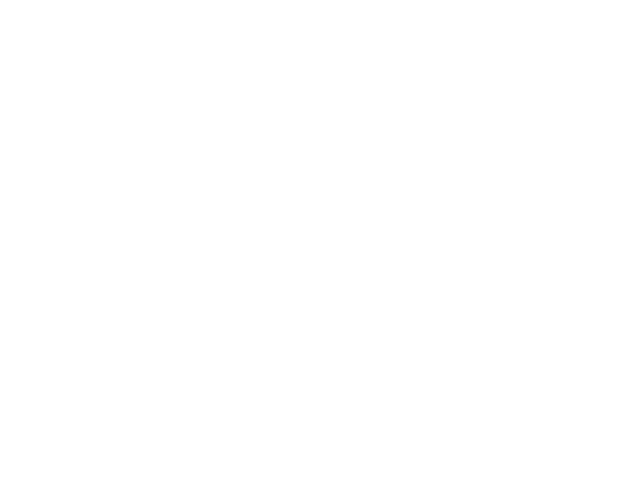

In [198]:
plt.figure()
plt.imshow(snorm)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide


<IPython.core.display.Javascript object>


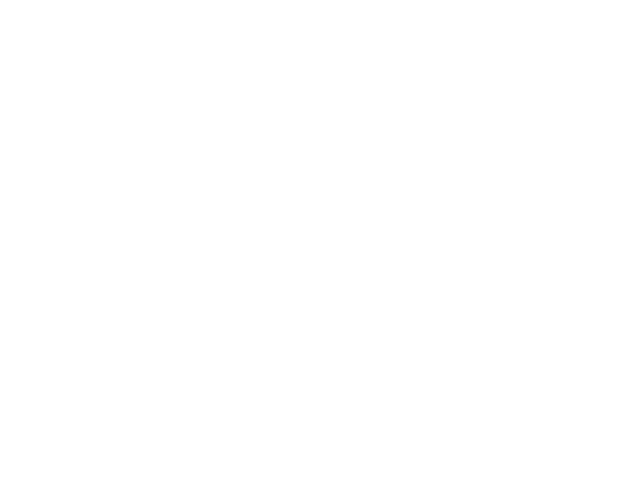

In [189]:
reload(sca)
sanglemax = {}
def compute_sangle(thisproc,thislkat):
    strialwise = thisproc['strialwise'][thislkat]
    angle = thisproc['angle']
    size = thisproc['size']
    contrast = thisproc['contrast']
    trialrun = thisproc['trialrun']
    uangle = np.unique(angle)
    usize = np.unique(size)
    ucontrast = np.unique(contrast)
    sangle = np.zeros((thislkat.sum(),usize.size,uangle.size))
    sangle0 = np.zeros((thislkat.sum(),usize.size,uangle.size))
    for i in range(sangle.shape[1]):
        for j in range(sangle.shape[2]):
            thiscond = np.logical_and(trialrun,np.logical_and(np.in1d(contrast,ucontrast[-2:]),np.logical_and(angle==uangle[j],size==usize[i])))
            sangle0[:,i,j] = strialwise[:,thiscond,nbefore:-nafter][:,:1].mean(-1).mean(-1)
            sangle[:,i,j] = strialwise[:,thiscond,nbefore:-nafter][:,1:].mean(-1).mean(-1)
    return sangle,sangle0
for k in (0,2):
    sangle,sangle0 = compute_sangle(proc[keylist[k]],lkatd[keylist[k]])
    sanglemax[keylist[k]] = align_to_max(sangle,sangle0)-spont[keylist[k]][lkatd[keylist[k]]][:,np.newaxis]
snorm = np.vstack([val for val in sanglemax.values()])
snorm = snorm/(snorm.max(1)[:,np.newaxis])
plt.figure()
lb,ub = ut.bootstrap(snorm,np.nanmean,pct=(2.5,97.5))
ut.plot_errorbar_hillel(45*np.arange(8),np.roll(np.nanmean(snorm,0),2),np.roll(lb,2),np.roll(ub,2))

In [183]:
snorm.shape

(99, 9)

In [ ]:
def polar(arr):
    nsectors = arr.size
    xpt = np.zeros_like(arr)

<IPython.core.display.Javascript object>


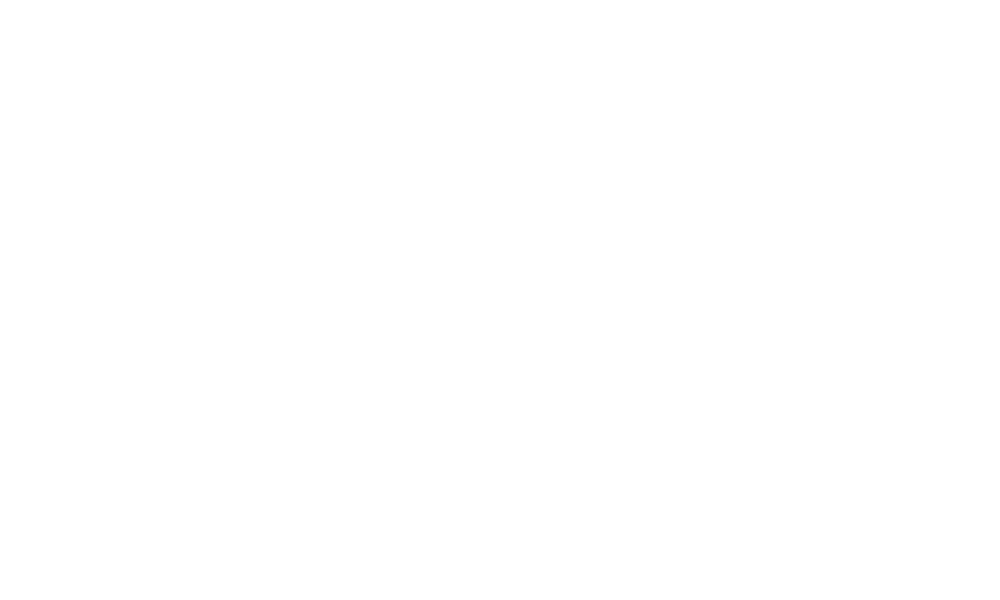

<IPython.core.display.Javascript object>


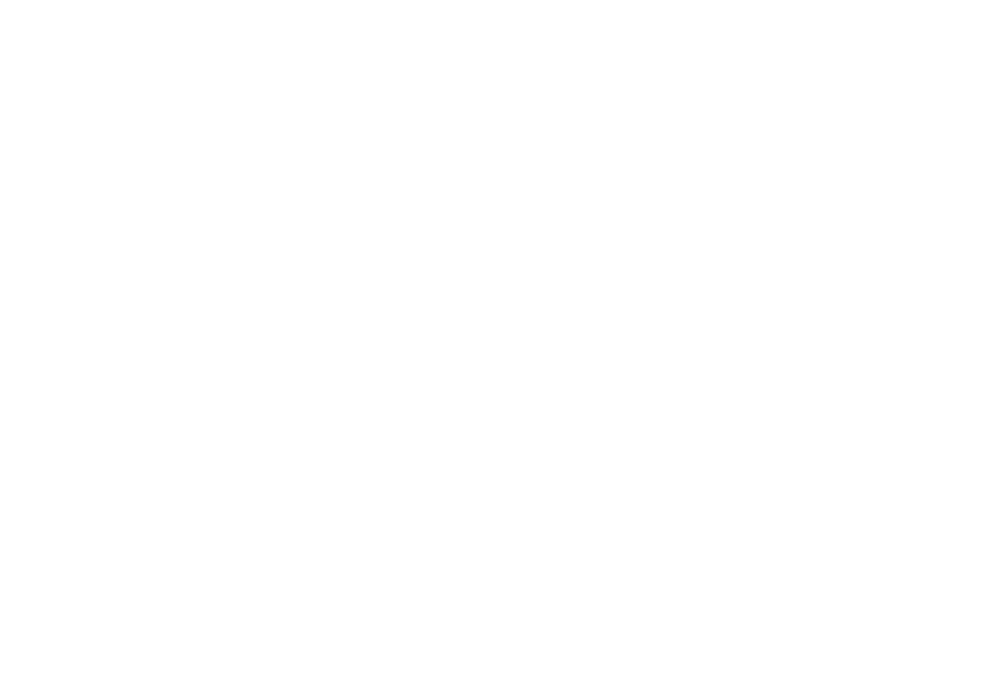

In [62]:
k = 0
sangle = compute_sangle(proc[keylist[k]],lkatd[keylist[k]])
ut.plot_in_rows(sangle[:,::2].transpose((0,2,1)),scale=1) #/sangle.max(2)[:,:,np.newaxis])
k = 2
sangle = compute_sangle(proc[keylist[k]],lkatd[keylist[k]])
ut.plot_in_rows(sangle[:,::2].transpose((0,2,1)),scale=1) #/sangle.max(2)[:,:,np.newaxis])

In [52]:
snorm = sca.get_norm_curves(soriavg,lkatd,append_gray=True)

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


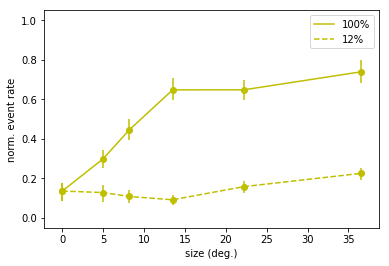

In [58]:
reload(ut)
plt.figure()
lb,ub = ut.bootstrap(snorm,np.nanmean,pct=(2.5,97.5))
s0 = np.concatenate(((0,),s))
plt.plot(s0.mean(),0.5,c='y',linestyle='solid')
plt.plot(s0.mean(),0.5,c='y',linestyle='dashed')
ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,-1],lb[:,-1],ub[:,-1],c='y',linestyle='solid')
ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2],c='y',linestyle='dashed')
plt.legend(['100%','12%'])
plt.ylabel('norm. event rate')
plt.xlabel('size (deg.)')
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)
# plt.savefig('sst_size_tuning.pdf')
# plt.savefig('sst_size_tuning.eps')
savedict = {}
savedict['size'] = s0
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['hi'] = (np.nanmean(snorm,axis=0)[:,-1],lb[:,-1],ub[:,-1])
savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2])
savedict['opt']['hi'] = {'c':'y','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'y','linestyle':'dashed'}

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


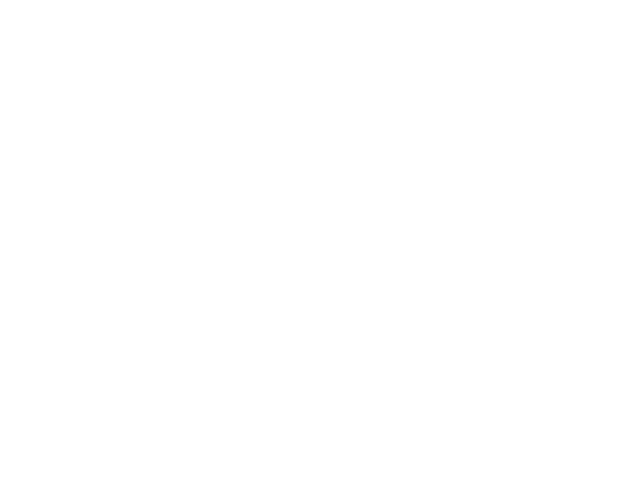

In [260]:
lkatd = {}
for k in ((0,2)):
    lkatd[keylist[k]] = np.logical_and(ret_vars[keylist[k]]['paramdict_normal']['amplitude'][()]>0,ontarget_ret_lax[keylist[k]])
    
snorm = sca.get_norm_curves(soriavg,lkatd,append_gray=True)
    
reload(ut)
plt.figure()
lb,ub = ut.bootstrap(snorm,np.nanmean,pct=(2.5,97.5))
s0 = np.concatenate(((0,),s))
col = [0,0,0.6,0,0.3,0]
khi = 5
kmid = 4
klo = 2
base = np.array((1,0.6,0))
to_add = np.array((1,1,1))-base
color = {}
color['lo'] = base+col[klo]*to_add
color['mid'] = base+col[kmid]*to_add
color['hi'] = base+col[khi]*to_add
for i in np.array((klo,kmid,khi)):
    plt.plot(s0.mean(),0.5,c=np.array((1,0.6,0))+col[i]*np.array((0,0.4,1)),linestyle='solid')
for i in np.array((klo,kmid,khi)):
    color = np.array((1,0.6,0))+col[i]*np.array((0,0.4,1))
    ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,i],lb[:,i],ub[:,i],c=color,linestyle='solid')
# ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2],c='r',linestyle='dashed')
plt.ylim((-0.05,1.05))
plt.legend(['12%','50%','100%'])
plt.ylabel('norm. event rate')
plt.xlabel('size (deg.)')
# plt.savefig('vip_facilitated_size_tuning.pdf')
# plt.savefig('vip_facilitated_size_tuning.eps')
# savedict = {}
# savedict['size'] = s0
# savedict['rate'] = {}
# savedict['opt'] = {}

# savedict['rate']['hi'] = (np.nanmean(snorm,axis=0)[:,khi],lb[:,khi],ub[:,khi])
# savedict['rate']['mid'] = (np.nanmean(snorm,axis=0)[:,kmid],lb[:,kmid],ub[:,kmid])
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,klo],lb[:,klo],ub[:,klo])
# savedict['opt']['hi'] = {'c':color['hi'],'linestyle':'solid'}
# savedict['opt']['mid'] = {'c':color['mid'],'linestyle':'solid'}
# savedict['opt']['lo'] = {'c':color['lo'],'linestyle':'solid'}
plt.savefig('sst_size_tuning_3.eps')
plt.savefig('sst_size_tuning_3.pdf')
import pickle as pkl
with open('sst_size_3.p', 'wb') as handle:
    pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)
# with open('vip_all_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


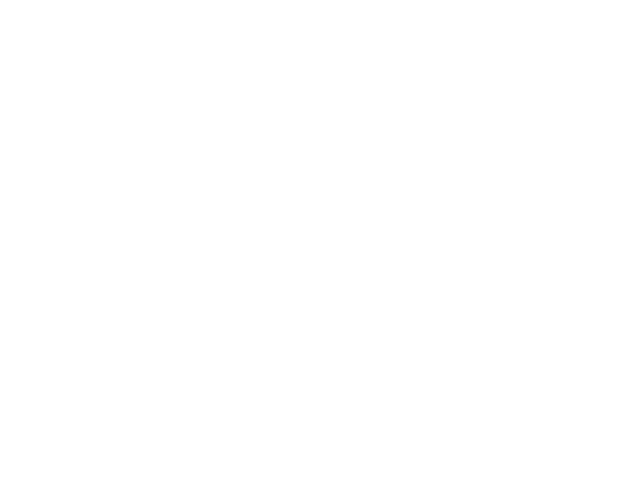

In [241]:
lkatd = {}
for k in ((0,2)):
    lkatd[keylist[k]] = np.logical_and(ret_vars[keylist[k]]['paramdict_normal']['amplitude'][()]>0,ontarget_ret_lax[keylist[k]])
    
snorm = sca.get_norm_curves(soriavg,lkatd,append_gray=True)
    
reload(ut)
plt.figure()
lb,ub = ut.bootstrap(snorm,np.nanmean,pct=(2.5,97.5))
s0 = np.concatenate(((0,),s))
col = [0,0,0.6,0,0.3,0]
khi = 5
kmid = 4
klo = 2
base = np.array((1,0.6,0))
to_add = np.array((1,1,1))-base
color = {}
color['lo'] = base+col[klo]*to_add
color['mid'] = base+col[kmid]*to_add
color['hi'] = base+col[khi]*to_add
for i in np.array((klo,)):
    plt.plot(s0.mean(),0.5,c=np.array((1,0.6,0))+col[i]*np.array((0,0.4,1)),linestyle='solid')
for i in np.array((klo,)):
    color = np.array((1,0.6,0))+col[i]*np.array((0,0.4,1))
    ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,i],lb[:,i],ub[:,i],c=color,linestyle='solid')
# ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2],c='r',linestyle='dashed')
plt.ylim((-0.05,1.05))
# plt.legend(['12%','50%','100%'])
plt.ylabel('norm. event rate')
plt.xlabel('size (deg.)')
# plt.savefig('vip_facilitated_size_tuning.pdf')
# plt.savefig('vip_facilitated_size_tuning.eps')
# savedict = {}
# savedict['size'] = s0
# savedict['rate'] = {}
# savedict['opt'] = {}

# savedict['rate']['hi'] = (np.nanmean(snorm,axis=0)[:,khi],lb[:,khi],ub[:,khi])
# savedict['rate']['mid'] = (np.nanmean(snorm,axis=0)[:,kmid],lb[:,kmid],ub[:,kmid])
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,klo],lb[:,klo],ub[:,klo])
# savedict['opt']['hi'] = {'c':color['hi'],'linestyle':'solid'}
# savedict['opt']['mid'] = {'c':color['mid'],'linestyle':'solid'}
# savedict['opt']['lo'] = {'c':color['lo'],'linestyle':'solid'}
plt.savefig('sst_size_tuning_12.eps')
plt.savefig('sst_size_tuning_12.pdf')
import pickle as pkl
# with open('sst_size_3.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)
# with open('vip_all_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


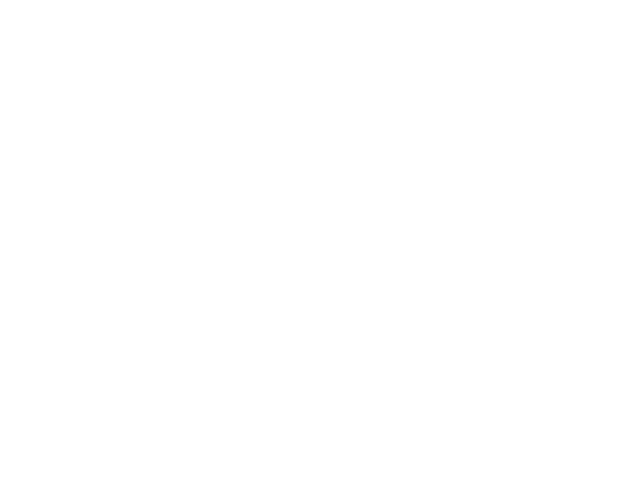

In [242]:
lkatd = {}
for k in ((0,2)):
    lkatd[keylist[k]] = np.logical_and(ret_vars[keylist[k]]['paramdict_normal']['amplitude'][()]>0,ontarget_ret_lax[keylist[k]])
    
snorm = sca.get_norm_curves(soriavg,lkatd,append_gray=True)
    
reload(ut)
plt.figure()
lb,ub = ut.bootstrap(snorm,np.nanmean,pct=(2.5,97.5))
s0 = np.concatenate(((0,),s))
col = [0,0,0.6,0,0.3,0]
khi = 5
kmid = 4
klo = 2
base = np.array((1,0.6,0))
to_add = np.array((1,1,1))-base
color = {}
color['lo'] = base+col[klo]*to_add
color['mid'] = base+col[kmid]*to_add
color['hi'] = base+col[khi]*to_add
for i in np.array((khi,)):
    plt.plot(s0.mean(),0.5,c=np.array((1,0.6,0))+col[i]*np.array((0,0.4,1)),linestyle='solid')
for i in np.array((khi,)):
    color = np.array((1,0.6,0))+col[i]*np.array((0,0.4,1))
    ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,i],lb[:,i],ub[:,i],c=color,linestyle='solid')
# ut.plot_errorbar_hillel(s0,np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2],c='r',linestyle='dashed')
plt.ylim((-0.05,1.05))
# plt.legend(['12%','50%','100%'])
plt.ylabel('norm. event rate')
plt.xlabel('size (deg.)')
# plt.savefig('vip_facilitated_size_tuning.pdf')
# plt.savefig('vip_facilitated_size_tuning.eps')
# savedict = {}
# savedict['size'] = s0
# savedict['rate'] = {}
# savedict['opt'] = {}

# savedict['rate']['hi'] = (np.nanmean(snorm,axis=0)[:,khi],lb[:,khi],ub[:,khi])
# savedict['rate']['mid'] = (np.nanmean(snorm,axis=0)[:,kmid],lb[:,kmid],ub[:,kmid])
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,klo],lb[:,klo],ub[:,klo])
# savedict['opt']['hi'] = {'c':color['hi'],'linestyle':'solid'}
# savedict['opt']['mid'] = {'c':color['mid'],'linestyle':'solid'}
# savedict['opt']['lo'] = {'c':color['lo'],'linestyle':'solid'}
plt.savefig('sst_size_tuning_100.eps')
plt.savefig('sst_size_tuning_100.pdf')
import pickle as pkl
# with open('sst_size_3.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)
# with open('vip_all_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [55]:
snorm.shape

(120, 6, 6)

In [113]:
lb.shape

(6, 6)

In [145]:
import pickle as pkl
with open('sst_size_3.p', 'wb') as handle:
    pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [5]:
with open('sst_size.p', 'rb') as handle:
    sstdict = pkl.load(handle)
with open('pc_size.p', 'rb') as handle:
    pcdict = pkl.load(handle)
with open('vip_all_size.p', 'rb') as handle:
    vipfdict = pkl.load(handle)

In [188]:
reload(ut)

<module 'pyute' from '/home/mossing/Documents/code/adesnal/pyute.py'>

In [6]:
def plot_size_tuning(dicts,keys):
    if not type(dicts) is list:
        dicts = [dicts]
    if not type(keys) is list:
        keys = [keys]
    for d in dicts:
        for key in keys:
            x = d['size']
            y = d['rate'][key]
            ut.plot_nothing(d['opt'][key])
            ut.plot_errorbar_hillel(x,y[0],y[1],y[2],plot_options=d['opt'][key])
    plt.ylabel('norm. event rate')
    plt.xlabel('size (deg.)')
    whitespace = 0.05
    plt.ylim(0-whitespace,1+whitespace)
    plt.xlim(-2.5,37.5)

In [7]:
def plot_contrast_tuning(dicts,keys):
    if not type(dicts) is list:
        dicts = [dicts]
    if not type(keys) is list:
        keys = [keys]
    for d in dicts:
        for key in keys:
            x = d['contrast']
            y = d['rate'][key]
            ut.plot_nothing(d['opt'][key])
            ut.plot_errorbar_hillel(x,y[0],y[1],y[2],plot_options=d['opt'][key])
    plt.ylabel('norm. event rate')
    plt.xlabel('contrast (%)')
    whitespace = 0.05
    plt.ylim(0-whitespace,1+whitespace)
    plt.xlim(-5,105)

<IPython.core.display.Javascript object>


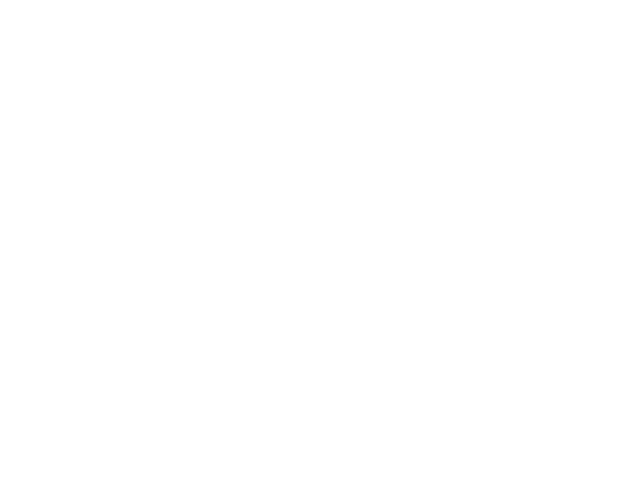

Text(0.5,1,'Size tuning at 12% contrast')

In [8]:
plt.figure()
plot_size_tuning([sstdict,pcdict],'lo')
plt.legend(['SST','PC'])
plt.title('Size tuning at 12% contrast')
# plt.savefig('updated_figs/size_tuning_pc_sst_12.pdf')

<IPython.core.display.Javascript object>


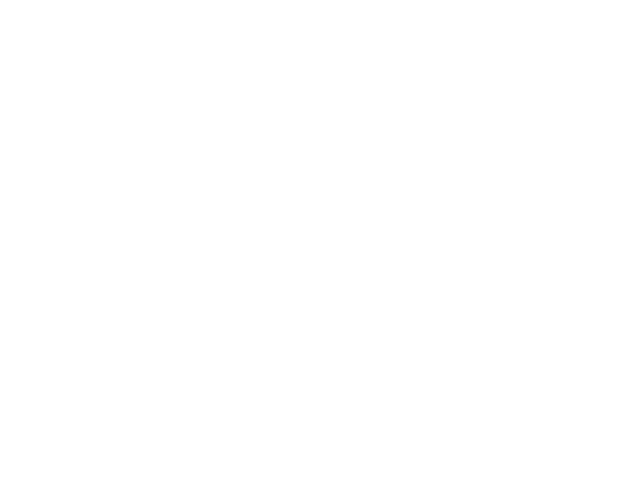

Text(0.5,1,'Size tuning at 12% contrast')

In [9]:
plt.figure()
plot_size_tuning([sstdict,pcdict],'hi')
plt.legend(['SST','PC'])
plt.title('Size tuning at 12% contrast')
# plt.savefig('updated_figs/size_tuning_pc_sst_100.pdf')

<IPython.core.display.Javascript object>


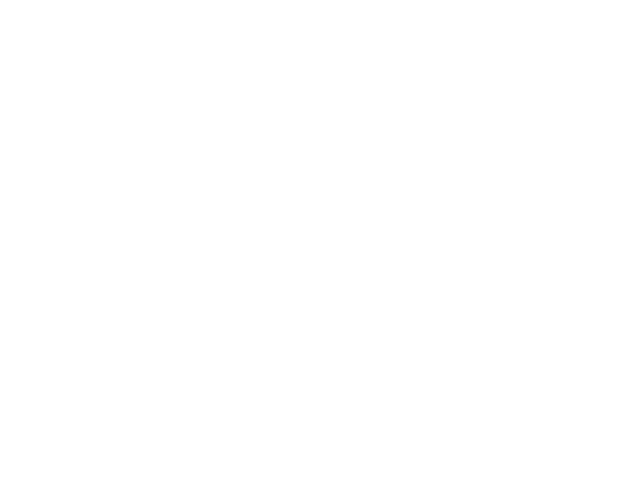

Text(0.5,1,'Size tuning at 12% contrast')

In [11]:
plt.figure()
plot_size_tuning([sstdict,vipfdict],'lo')
plt.legend(['SST','VIP'])
plt.title('Size tuning at 12% contrast')
# plt.savefig('updated_figs/size_tuning_vip_sst_12.pdf')

<IPython.core.display.Javascript object>


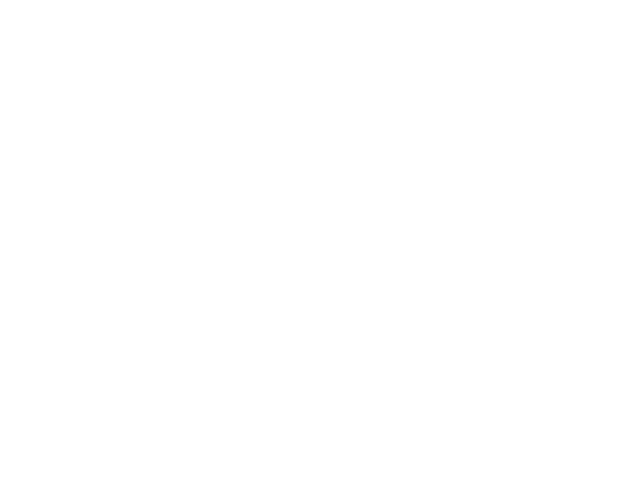

Text(0.5,1,'Size tuning at 100% contrast')

In [12]:
plt.figure()
plot_size_tuning([sstdict,vipfdict],'hi')
plt.legend(['SST','VIP'])
plt.title('Size tuning at 100% contrast')
# plt.savefig('updated_figs/size_tuning_vip_sst_100.pdf')

<IPython.core.display.Javascript object>


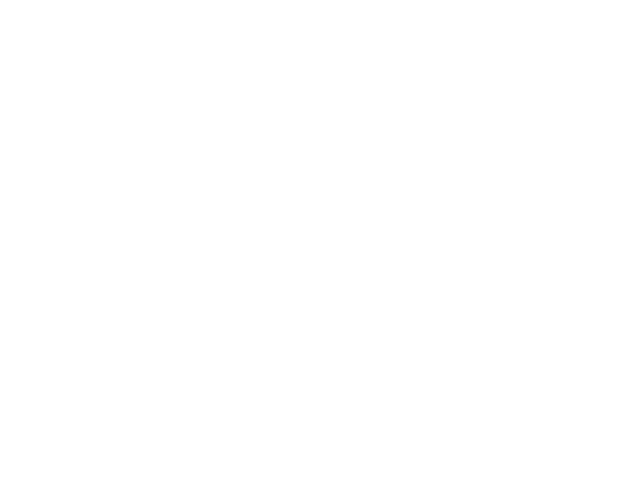

In [220]:
plt.figure()
plot_size_tuning([sstdict],['hi','lo'])
plt.legend(['100% contrast','12% contrast'])
plt.title('SST size tuning')
plt.savefig('updated_figs/size_tuning_sst.pdf')

<IPython.core.display.Javascript object>


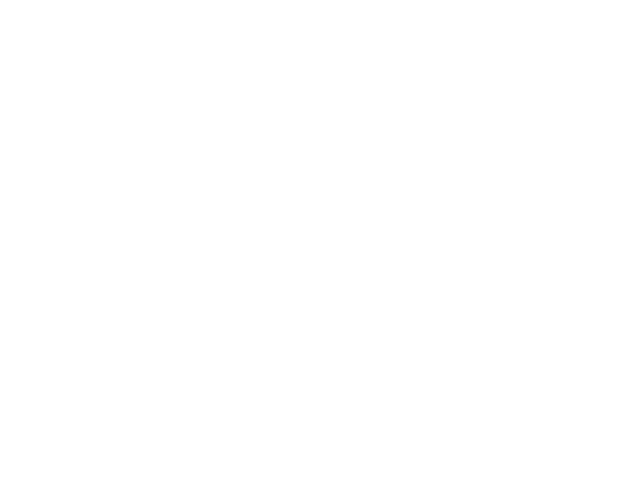

In [272]:
plt.figure()
plot_size_tuning([vipfdict],['hi','lo'])
plt.legend(['100% contrast','12% contrast'])
plt.title('Suppressed VIP size tuning')
plt.savefig('updated_figs/size_tuning_vipf.pdf')

<IPython.core.display.Javascript object>


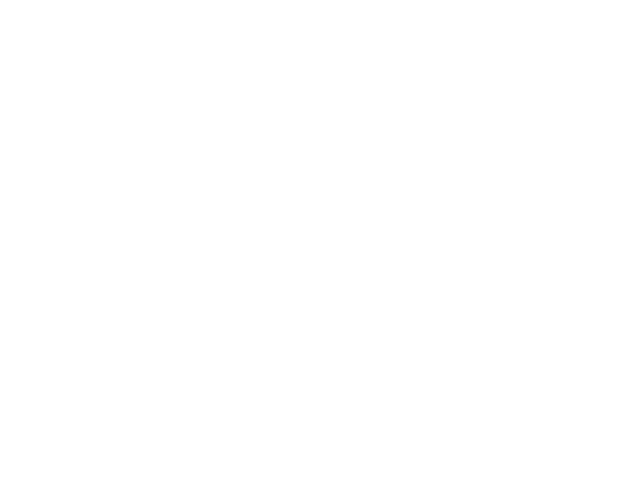

Text(0.5,1,'PC size tuning')

In [21]:
plt.figure()
pcdict_new = pcdict.copy()
pcdict_new['opt']['lo']['c'] = 0.6*np.array((1,1,1))
pcdict_new['opt']['lo']['linestyle'] = 'solid' 
plot_size_tuning([pcdict_new],['hi','lo'])
pcdict['opt']['lo']['c'] = 0.6*np.array((1,1,1))
pcdict['opt']['lo']['linestyle'] = 'solid' 
plt.legend(['100% contrast','12% contrast'])
plt.title('PC size tuning')
# plt.savefig('updated_figs/size_tuning_pc.pdf')

<IPython.core.display.Javascript object>


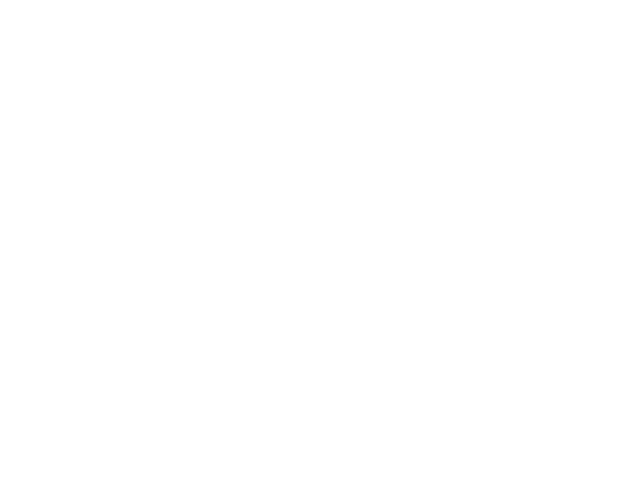

Text(0.5,1,'Size tuning at 100% contrast')

In [26]:
plt.figure()
sstdict_new = sstdict.copy()
sstdict_new['opt']['lo']['c'] = np.array((1,1,0.6))
sstdict_new['opt']['lo']['linestyle'] = 'solid' 
plot_size_tuning([sstdict_new,vipfdict,pcdict_new],'hi')
plt.legend(['SST','VIP','PC'])
plt.title('Size tuning at 100% contrast')
# plt.savefig('updated_figs/size_tuning_all_100.pdf')

In [215]:
os.mkdir('updated_figs')

<IPython.core.display.Javascript object>


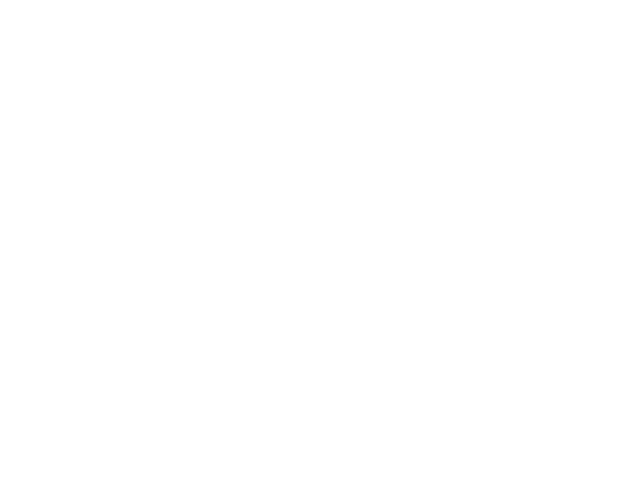

Text(0.5,1,'Size tuning at 12% contrast')

In [27]:
plt.figure()
plot_size_tuning([sstdict_new,vipfdict,pcdict_new],'lo')
plt.legend(['SST','suppressed VIP','PC'])
plt.title('Size tuning at 12% contrast')
# plt.savefig('updated_figs/size_tuning_all_12.pdf')

In [269]:
with open('sst_contrast.p', 'rb') as handle:
    sstdict = pkl.load(handle)
with open('pc_contrast.p', 'rb') as handle:
    pcdict = pkl.load(handle)
with open('vip_facilitated_contrast.p', 'rb') as handle:
    vipfdict = pkl.load(handle)

<IPython.core.display.Javascript object>


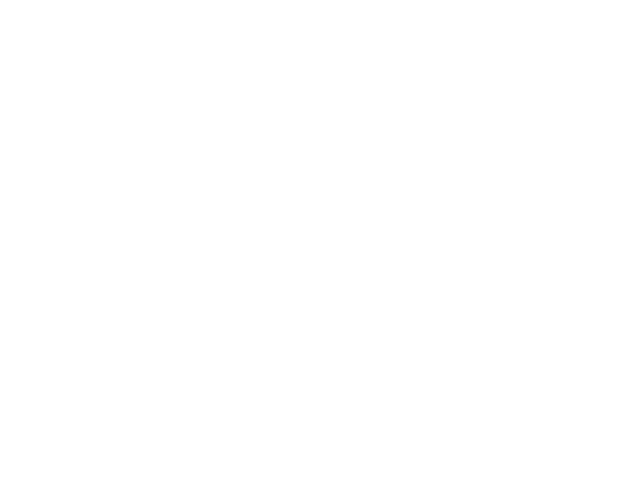

In [256]:
plt.figure()
plot_contrast_tuning([pcdict],'mid')
plt.title('PC contrast tuning')
plt.legend(['15 deg.'])
plt.savefig('updated_figs/contrast_tuning_pc.pdf')

<IPython.core.display.Javascript object>


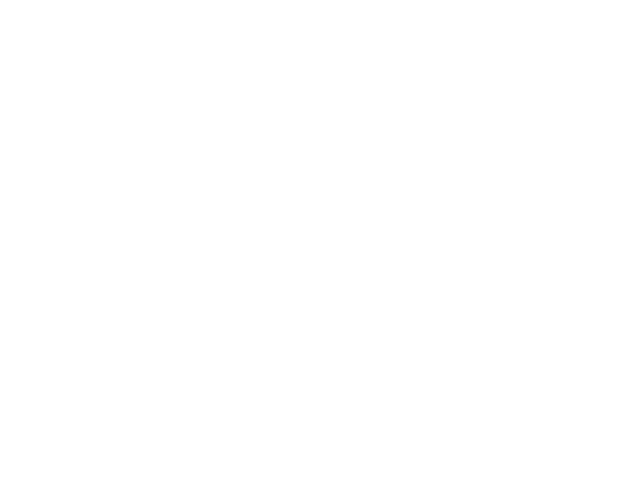

In [257]:
plt.figure()
plot_contrast_tuning([sstdict],'mid')
plt.legend(['13.5 deg.'])
plt.title('SST contrast tuning')
plt.savefig('updated_figs/contrast_tuning_sst.pdf')


<IPython.core.display.Javascript object>


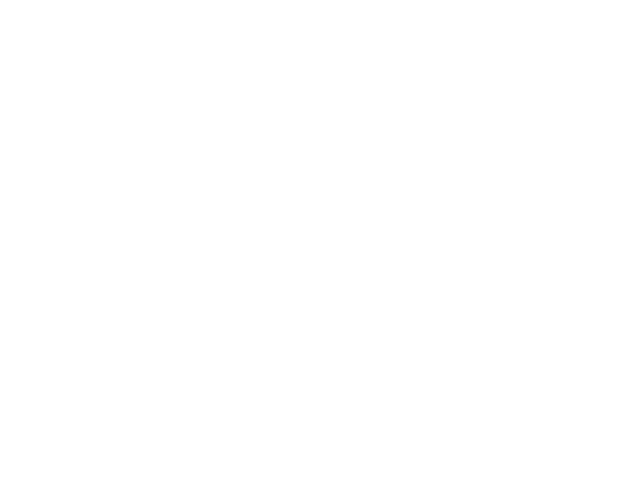

In [270]:
plt.figure()
plot_contrast_tuning([vipfdict],'mid')
plt.legend(['13.5 deg.'])
plt.title('Facilitated VIP contrast tuning')
plt.savefig('updated_figs/contrast_tuning_vipf.pdf')

<IPython.core.display.Javascript object>


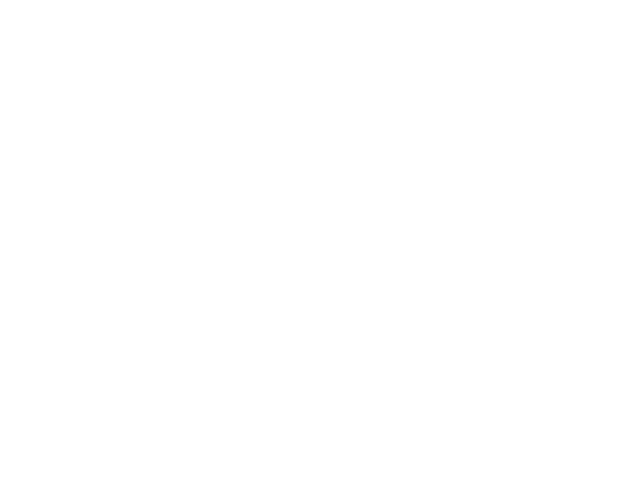

In [263]:
plt.figure()
plot_contrast_tuning([sstdict,vipfdict],'mid')
plt.legend(['SST','Suppressed VIP'])
plt.title('VIP/SST contrast tuning')
plt.savefig('updated_figs/contrast_tuning_vip_sst.pdf')

<IPython.core.display.Javascript object>


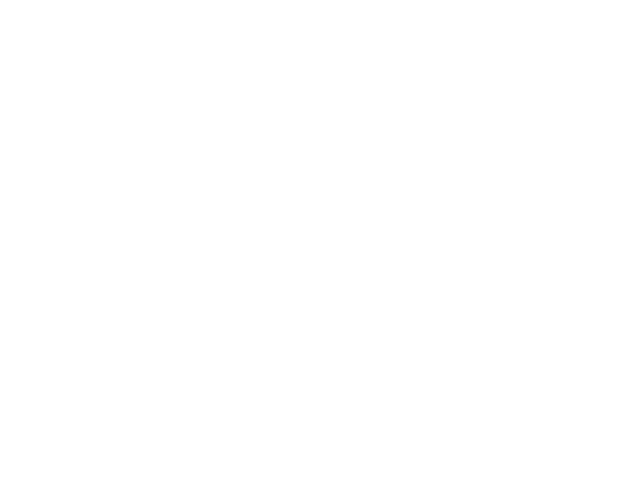

In [261]:
plt.figure()
plot_contrast_tuning([pcdict,sstdict],'mid')
plt.legend(['PC','SST'])
plt.title('PC/SST contrast tuning')
plt.savefig('updated_figs/contrast_tuning_pc_sst.pdf')

<IPython.core.display.Javascript object>


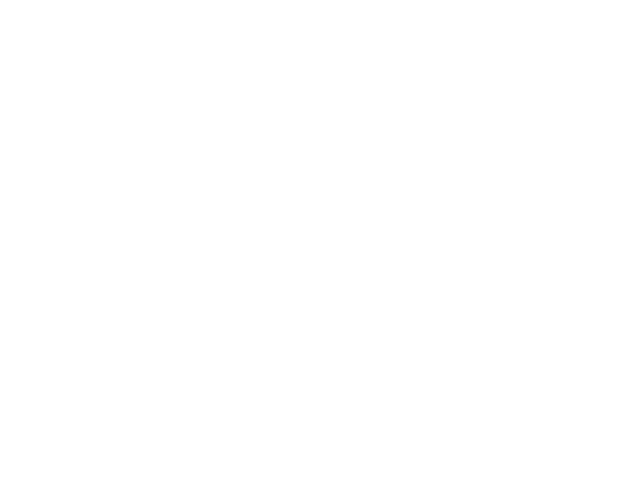

In [262]:
plt.figure()
plot_contrast_tuning([pcdict,sstdict,vipfdict],'mid')
plt.legend(['PC','SST','Suppressed VIP'])
plt.title('PC/SST/VIP contrast tuning')
plt.savefig('updated_figs/contrast_tuning_all.pdf')

In [239]:
pcdict

{'contrast': array([ 0.07929454,  0.07542199,  0.07126368,  0.06782169,  0.0658331 ,
         0.07048537,  0.07725713,  0.08022865,  0.07892931,  0.07486505,
         0.07065421,  0.06739313]),
 'opt': {'mid': {'c': 'k', 'linestyle': None, 'linewidth': 2}},
 'rate': {'mid': (array([ 0.11923892,  0.28817227,  0.51742372,  0.781165  ,  0.80194701,
           0.83687109]),
   array([ 0.09465121,  0.2602508 ,  0.48882437,  0.76026089,  0.77255766,
           0.80137302]),
   array([ 0.14725709,  0.31614694,  0.54447511,  0.8015475 ,  0.83178084,
           0.87022327]))}}

In [27]:
c = np.array((0,0.06,0.12,0.25,0.5,1))*100

In [35]:
np.nanmean(snorm1,axis=0).shape

(1, 6)

In [45]:
np.nanmean(snorm1,axis=0)

array([ 0.14707988,  0.08887824,  0.09860112,  0.19120157,  0.39830916,
        0.96147174])

In [47]:
lb

array([ 0.08477842,  0.05555671,  0.06757872,  0.14461233,  0.34401496,
        0.89976059])

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


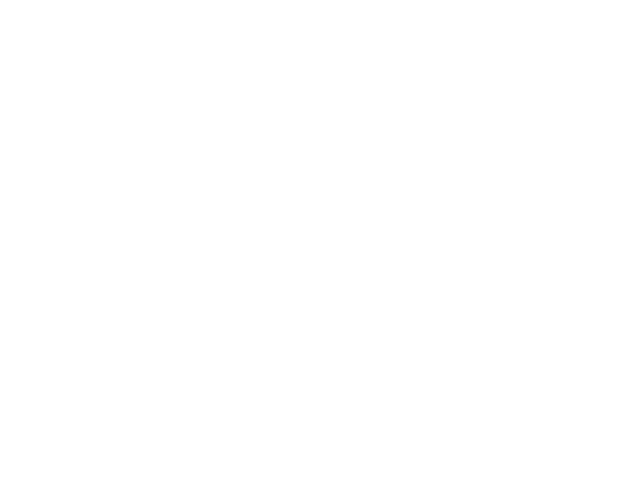

In [278]:
cdict = {}

c = np.array((0,0.06,0.12,0.25,0.5,1))*100

szs = np.array((0,1,2,3,4))
k = 0
lkat = ontarget_ret_lax[keylist[k]] #ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:lkat},append_gray=False)
# plt.plot(c,snorm[:,0].T,c='r',alpha=1e-1)
# plt.plot(c,snorm[:,0].mean(0),c='r')
snorm1 = snorm

k = 2
lkat = ontarget_ret_lax[keylist[k]] #ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:lkat},append_gray=False)
# plt.plot(c,snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(c,snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,snorm))

plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(c,np.nanmean(snorm1[:,2],axis=0),lb[2],ub[2],c=np.array((1,0.6,0)))
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
#plt.savefig('sst_crf_one.pdf')
#plt.savefig('sst_crf_one.eps')

savedict = {}
savedict['contrast'] = c
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['mid'] = (np.nanmean(snorm1,axis=0),lb,ub)
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2])
savedict['opt']['mid'] = {'c':'y','linewidth':2}
# savedict['opt']['lo'] = {'c':'y','linestyle':'dashed'}
import naka_rushton_analysis as nra
reload(nra)
c = np.array((0,6,12,25,50,100))
#ncells = soriavg[thisfold].shape[0]
#nsizes = soriavg[thisfold].shape[1]
popt = nra.fit_opt_params(c,np.nanmean(snorm1[:,2],axis=0))
cinterp = np.arange(100)
plt.plot(cinterp,nra.naka_rushton(cinterp,popt).T)

In [272]:
popt.shape

(12,)

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


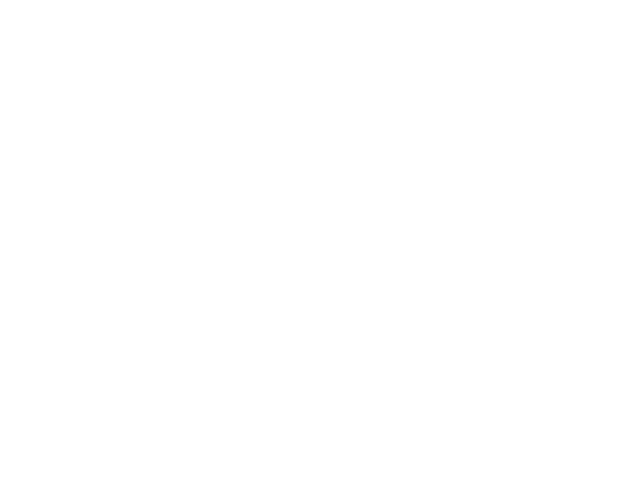

In [259]:
cdict = {}

c = np.array((0,0.06,0.12,0.25,0.5,1))*100

szs = np.array((0,1,2,3,4))
k = 0

lkat = ontarget_ret_lax[keylist[k]] #ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:lkat},sizes=(0,1,2,3,4),append_gray=False)
# plt.plot(c,snorm[:,0].T,c='r',alpha=1e-1)
# plt.plot(c,snorm[:,0].mean(0),c='r')
snorm1 = snorm

k = 2
lkat = ontarget_ret_lax[keylist[k]] #ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:lkat},sizes=(0,1,2,3,4),append_gray=False)
# plt.plot(c,snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(c,snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,snorm))

plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
for i in (1,2,4):
    plt.plot(0,0,c=np.array((1,0.6,0))+np.array((0,0.4,1))*(5-i)/5)
for i in (1,2,4):
    ut.plot_errorbar_hillel(c,np.nanmean(snorm1[:,i],axis=0),lb[i],ub[i],c=np.array((1,0.6,0))+np.array((0,0.4,1))*(5-i)/5)
plt.ylim(-0.05,1.05)
plt.legend(['8 deg','13 deg','36 deg'])
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
plt.savefig('sst_crf_three.pdf')
plt.savefig('sst_crf_three.eps')

savedict = {}
savedict['contrast'] = c
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['mid'] = (np.nanmean(snorm1,axis=0),lb,ub)
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2])
savedict['opt']['mid'] = {'c':'y','linewidth':2}
# savedict['opt']['lo'] = {'c':'y','linestyle':'dashed'}

/home/mossing/Documents/code/adesnal/size_contrast_analysis.py:248: RuntimeWarning: invalid value encountered in true_divide
  return arr/np.nanmax(np.nanmax(arr,axis=1),axis=1)[:,np.newaxis,np.newaxis]


<IPython.core.display.Javascript object>


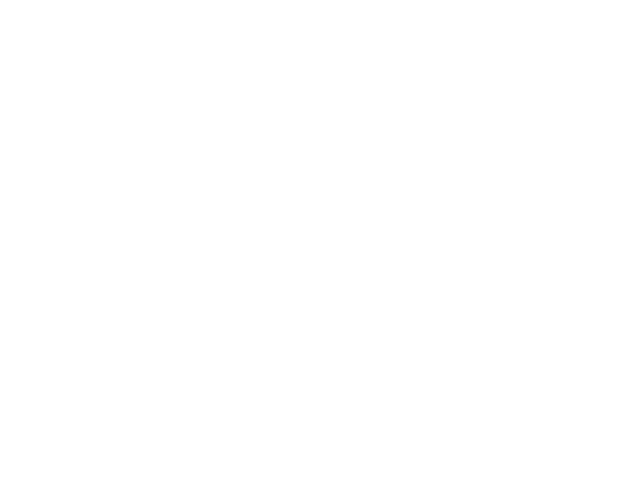

In [261]:
cdict = {}

c = np.array((0,0.06,0.12,0.25,0.5,1))*100

szs = np.array((0,1,2,3,4))
k = 0
lkat = ontarget_ret_lax[keylist[k]] #ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:lkat},append_gray=False)
# plt.plot(c,snorm[:,0].T,c='r',alpha=1e-1)
# plt.plot(c,snorm[:,0].mean(0),c='r')
snorm1 = snorm[:,2]

k = 2
lkat = ontarget_ret_lax[keylist[k]] #ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:lkat},append_gray=False)
# plt.plot(c,snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(c,snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,snorm[:,2]))

plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(c,np.nanmean(snorm1,axis=0),lb,ub,c=np.array((1,0.6,0)))
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
#plt.savefig('sst_crf_one.pdf')
#plt.savefig('sst_crf_one.eps')

savedict = {}
savedict['contrast'] = c
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['mid'] = (np.nanmean(snorm1,axis=0),lb,ub)
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2])
savedict['opt']['mid'] = {'c':'y','linewidth':2}
# savedict['opt']['lo'] = {'c':'y','linestyle':'dashed'}

In [227]:
import pickle as pkl
with open('sst_contrast.p', 'wb') as handle:
    pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [12]:
# szs = np.array(((2,2,2,2,2,2))

# for k in np.array((1,2,3,5)):
#     lkat = np.logical_and(ret_vars[keylist[k]]['paramdict_normal']['amplitude'][()]<0,ontarget_ret_lax[keylist[k]])
#     snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:lkat},sizes=(0,),append_gray=False)
#     # plt.plot(c,snorm[:,0].T,c='r',alpha=1e-1)
#     # plt.plot(c,snorm[:,0].mean(0),c='r')
#     if k==1:
#         snorm1 = snorm[:,0]
#     else:
#         snorm1 = np.vstack((snorm1,snorm[:,0]))
               
szs = [np.array((2,4))]*6

for k in np.array((0,2)):
    lkat = ontarget_ret_lax[keylist[k]]
    snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:lkat},sizes=(0,1),append_gray=False)
    # plt.plot(c,snorm[:,0].T,c='r',alpha=1e-1)
    # plt.plot(c,snorm[:,0].mean(0),c='r')
    if k==1:
        snorm1 = snorm
    else:
        snorm1 = np.vstack((snorm1,snorm))


plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(c,np.nanmean(snorm1[:,0],axis=0),lb[0],ub[0],c='y',linewidth=2)
ut.plot_errorbar_hillel(c,np.nanmean(snorm1[:,1],axis=0),lb[1],ub[1],c='y',linewidth=3)
# plt.plot(c,snorm1.T,alpha=0.01,c='b')
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')

# plt.savefig('sst_crf_two.pdf')
# plt.savefig('sst_crf_two.eps')

NameError: name 'snorm1' is not defined

In [24]:
k = 2
soriavg[keylist[k]].shape

(130, 5, 6)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


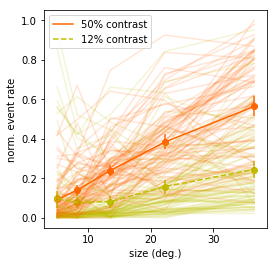

In [21]:
def snorm_two_curves(soriavg,theserows,lkat):
    keylist = list(lkat.keys())
    snorm = np.array(())
    for key in keylist:
#         biny = np.in1d(np.arange(soriavg[key].shape[1]),theserows)
        binx = np.in1d(np.arange(soriavg[key].shape[2]),theserows)
        to_add = soriavg[key][lkat[key]][:,:,binx]
        to_add = to_add/soriavg[key][lkat[key]].max(1).max(1)[:,np.newaxis,np.newaxis]
        if snorm.size:
            snorm = np.vstack((snorm,to_add))
        else:
            snorm = to_add
    return snorm

lkatd = {}
plt.figure(figsize=(4,4))
for k in np.array((0,2)):
    lkat = ontarget_ret_lax[keylist[k]] #np.logical_and(ontarget[keylist[k]],ontarget_ret_lax[keylist[k]])
    lkatd[keylist[k]] = lkat
    snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])
    lbmn,ubmn = ut.bootstrap(snorm[lkat],np.nanmean,axis=0,pct=(16,84))

#     
    reload(ut)

    # goldenrod = np.array((218,165,32))/255
    salmon = np.array((250,128,114))/255

    plt.plot(30,0.5,linestyle='solid',c=goldenrod)
    plt.plot(30,0.5,linestyle='dashed',c='y')
    plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.16,c='y')
    plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.16,c=goldenrod)
    whitespace = 0.05
    plt.ylim(0-whitespace,1+whitespace)
    plt.xlabel('size (deg.)')
    plt.ylabel('norm. event rate')
    plt.legend(['50% contrast','12% contrast'])
    
snorm = snorm_two_curves(soriavg,theserows,lkatd)
lbmn,ubmn = ut.bootstrap(snorm,np.nanmean,axis=0,pct=(2.5,97.5))
fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c=goldenrod)
fn_inner = lambda x: x[1]
do_three(s,np.nanmean(snorm,axis=0).T,lbmn.T,ubmn.T,fn_outer,fn_inner)
fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='y')
fn_inner = lambda x: x[0]
do_three(s,np.nanmean(snorm,axis=0).T,lbmn.T,ubmn.T,fn_outer,fn_inner)
# plt.savefig('sst_12_50_size_tuning_curves.pdf')

In [458]:
s

array([  5. ,   8.2,  13.5,  22.2,  36.5])

In [494]:
ontarget_ret_lax[keylist[2]].sum()

28

<IPython.core.display.Javascript object>


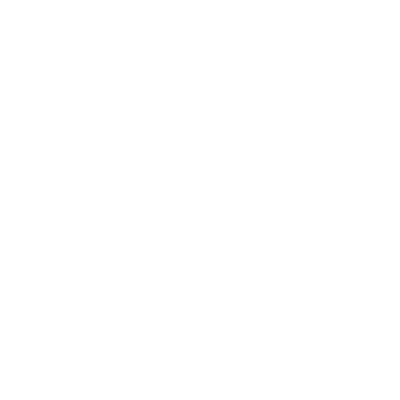

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


In [500]:
def snorm_four_pts(soriavg,pts,lkat):
    keylist = list(lkat.keys())
    snorm = np.array(())
    for key in keylist:
        biny = np.in1d(np.arange(soriavg[key].shape[1]),pts[key][:2])
        binx = np.in1d(np.arange(soriavg[key].shape[2]),pts[key][2:])
        to_add = soriavg[key][lkat[key]][:,biny][:,:,binx]
        to_add = to_add/soriavg[key][lkat[key]].max(1).max(1)[:,np.newaxis,np.newaxis]
        if snorm.size:
            snorm = np.vstack((snorm,to_add))
        else:
            snorm = to_add
    return snorm

plt.figure(figsize=(4,4))

pts = {}
pts[keylist[0]] = np.array((1,4,2,4))
pts[keylist[2]] = np.array((1,4,2,4))
lkat = {}
lkat[keylist[0]] = ontarget_ret_lax[keylist[0]]
lkat[keylist[2]] = ontarget_ret_lax[keylist[2]]
snorm = snorm_four_pts(soriavg,pts,lkat)
lbmn,ubmn = ut.bootstrap(snorm,np.nanmean,axis=0,pct=(16,84))

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c=goldenrod)
fn_inner = lambda x: x[:,1]
do_three(np.array((0,1)),np.nanmean(snorm,axis=0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='y')
fn_inner = lambda x: x[:,0]
do_three(np.array((0,1)),np.nanmean(snorm,axis=0),lbmn,ubmn,fn_outer,fn_inner)

plt.plot(0.5,0.5,linestyle='solid',c=goldenrod)
plt.plot(0.5,0.5,linestyle='dashed',c='y')
plt.plot(np.array((0,1)),snorm[:,:,0].T,alpha=0.08,c='y')
plt.plot(np.array((0,1)),snorm[:,:,1].T,alpha=0.08,c=goldenrod)
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['50% contrast','12% contrast'])
whitespace = 0.5
plt.xlim((-whitespace,1+whitespace))
plt.xticks((0,1))
plt.gca().set_xticklabels(('7-10 deg.','30-37 deg.'))
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)
plt.savefig('sst_12_50_zoomed.pdf')

<IPython.core.display.Javascript object>


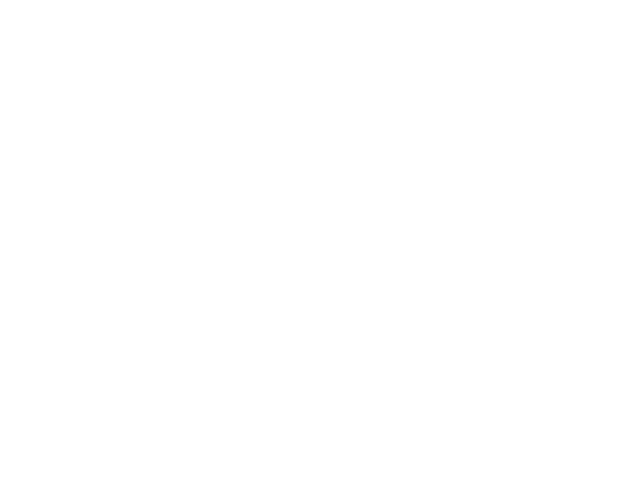

<IPython.core.display.Javascript object>


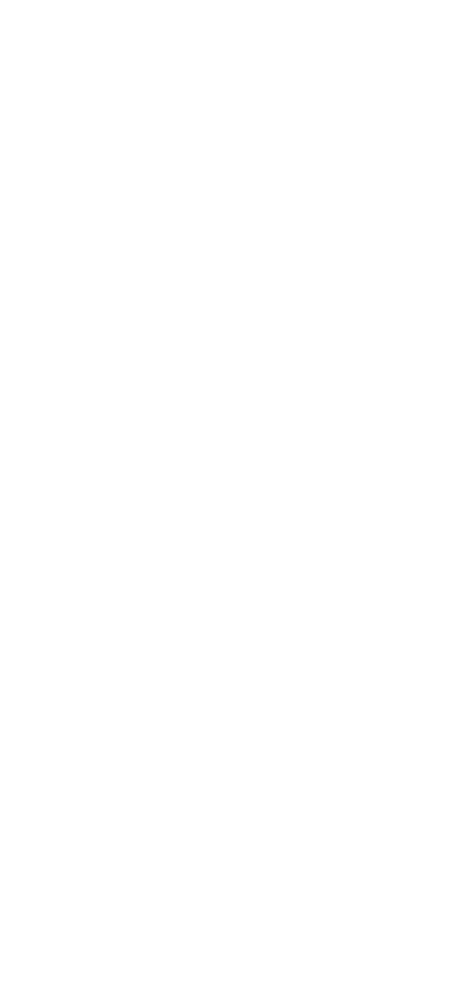

In [344]:
ut.imshow_in_rows(ret[keylist[0]])
# plt.imshow(ret[keylist[0]][11])

<IPython.core.display.Javascript object>


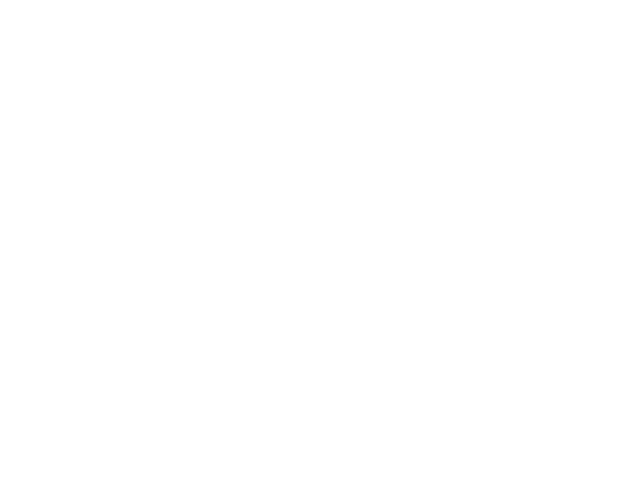

In [52]:
# a neat visualization showing how measurement noise changes the depth of the optimal fit basin
plt.figure()
x = np.linspace(-2,2,100)
e1 = 0.1
e2 = 1
def sqerrorfun(x,e):
    return (x+e)**2 + x**2 + (x-e)**2
plt.plot(x,np.log(sqerrorfun(x,e1)))
plt.plot(x,np.log(sqerrorfun(x,e2)))

In [106]:
# def naka_rushton(c,params):
#     a = params[0]
#     b = params[1]
#     c50 = params[2]
#     n = params[3]
#     return (a*(c/c50)**n + b)/(1+(c/c50)**n)

In [133]:
# def naka_rushton_all(c,params,ncells):
#     a = params[:ncells]
#     b = params[ncells]
#     c50 = params[ncells+1:-1]
#     n = params[-1]
#     aux = (c[np.newaxis]/c50[:,np.newaxis])**n
#     return (a[:,np.newaxis]*aux + b)/(1+aux)

In [202]:
# def naka_rushton_only_a(c,params,ncells):
#     a = params[:ncells]
#     b = params[ncells]
#     c50 = params[ncells+1]
#     n = params[-1]
#     aux = (c[np.newaxis,:]/c50)**n
#     return (a[:,np.newaxis]*aux + b)/(1+aux)

In [31]:
c = np.array((0,0.06,0.12,0.25,0.5,1))*100

In [180]:
# def fit_opt_params(r):
#     a_0 = r.max()
#     b_0 = 0
#     c50_0 = 50
#     n_0 = 2
#     params_0 = np.array((a_0,b_0,c50_0,n_0))
#     params_opt = sop.least_squares(lambda params: r-naka_rushton(c,params),params_0,bounds=(0,np.inf))
#     return params_opt['x']

In [181]:
# def fit_opt_params_all(R):
#     nsizes = R.shape[0]
#     a_0 = R.max(1)
#     b_0 = 0
#     c50_0 = 50*np.ones(nsizes)
#     n_0 = 2
#     params_0 = np.concatenate((a_0,(b_0,),c50_0,(n_0,)))
#     params_opt = sop.least_squares(lambda params: (R-naka_rushton_all(c,params,nsizes)).flatten(),params_0,bounds=(0,np.inf))
#     return params_opt['x']

In [203]:
# def fit_opt_params_only_a(R):
#     nsizes = R.shape[0]
#     a_0 = R.max(1)
#     b_0 = 0
#     c50_0 = 50
#     n_0 = 2
#     params_0 = np.concatenate((a_0,(b_0,),(c50_0,),(n_0,)))
#     params_opt = sop.least_squares(lambda params: (R-naka_rushton_only_a(c,params,nsizes)).flatten(),params_0,bounds=(0,np.inf))
#     return params_opt['x']

In [23]:
import naka_rushton_analysis as nra
reload(nra)
c = np.array((0,6,12,25,50,100))
ncells = soriavg[thisfold].shape[0]
nsizes = soriavg[thisfold].shape[1]
popt = np.zeros((ncells,nsizes,4))
for k in range(ncells):
    r = soriavg[thisfold][k]
    for s in range(r.shape[0]):
        popt[k,s] = nra.fit_opt_params(c,r[s])

/home/mossing/Documents/code/adesnal/naka_rushton_analysis.py:22: RuntimeWarning: overflow encountered in power
  n_0 = 2
/home/mossing/Documents/code/adesnal/naka_rushton_analysis.py:22: RuntimeWarning: invalid value encountered in true_divide
  n_0 = 2


In [47]:
reload(nra)
ncells = soriavg[thisfold].shape[0]
nsizes = soriavg[thisfold].shape[1]
popt_all = np.zeros((ncells,2*(1+nsizes)))
for k in range(ncells):
    print(k)
    R = soriavg[thisfold][k]
    popt_all[k] = nra.fit_opt_params_all(c,R)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152


In [ ]:
ncells = soriavg[thisfold].shape[0]
nsizes = soriavg[thisfold].shape[1]
ncontrasts = soriavg[thisfold].shape[2]
popt_only_a = np.zeros((ncells,3+nsizes))
for k in range(ncells):
    print(k)
    R = soriavg[thisfold][k]
    popt_only_a[k] = nra.fit_opt_params_only_a(c,R)

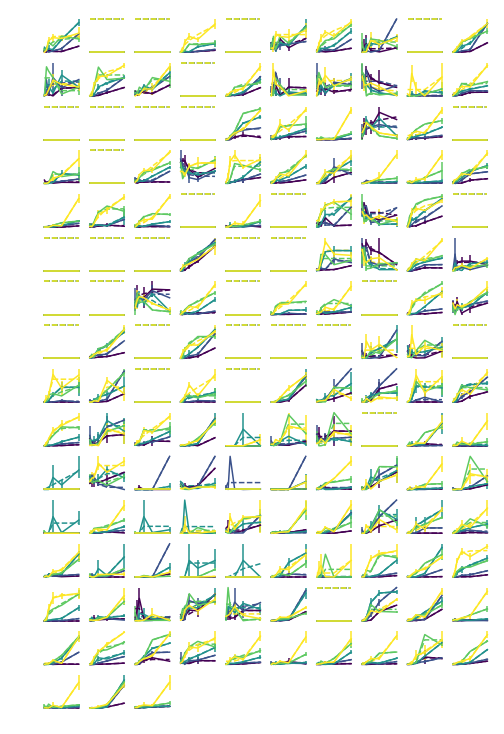

In [36]:
plt.figure(figsize=(8,24))
for k in range(ncells):
    plt.subplot(30,10,k+1)
    r = soriavg[thisfold][k]
    colors = plt.cm.viridis(np.linspace(0,1,nsizes))
    ut.plot_errorbars(c,r,lb[thisfold][k].mean(0),ub[thisfold][k].mean(0),colors=colors)
    for s in range(r.shape[0]):
        plt.plot(c,nra.naka_rushton(c,popt[k,s]),c=colors[s],linestyle='dashed')
        plt.axis('off')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3239: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  'bottom=%s, top=%s') % (bottom, top))


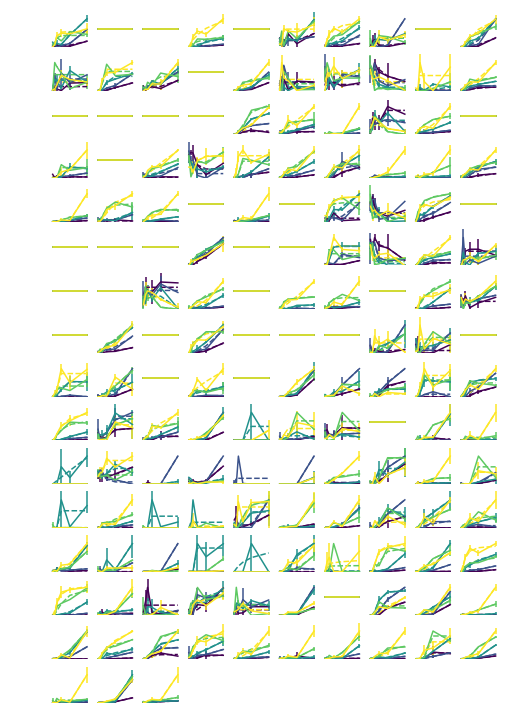

In [52]:
plt.figure(figsize=(8,24))
alpha = 1
for k in range(ncells):
    plt.subplot(30,10,k+1)
    r = soriavg[thisfold][k]
    colors = plt.cm.viridis(np.linspace(0,1,nsizes))
    sim = nra.naka_rushton_all(c,popt_all[k],nsizes)
    ut.plot_errorbars(c,r,lb[thisfold][k].mean(0),ub[thisfold][k].mean(0),colors=1-alpha*(1-colors))
    plt.axis('off')
    for s in range(r.shape[0]):
        plt.plot(c,sim[s],c=colors[s],linestyle='dashed')
    plt.ylim(r.min(),r.max()*1.3)

In [66]:
Rgrand = np.zeros((len(keylist),)+soriavg[thisfold][0].shape)
for i,key in enumerate(keylist):
    gd = soriavg[key][:,-1,0]<soriavg[key][:,-1,-1]
    Rgrand[i] = soriavg[key][np.logical_and(gd,ontarget_ret_lax[key])].mean(0)

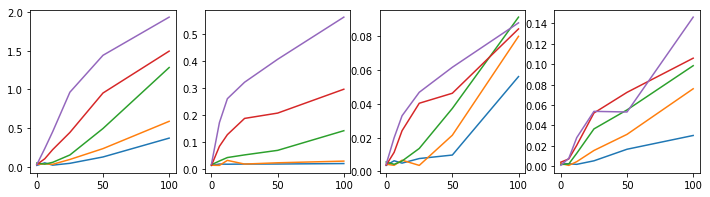

In [71]:
plt.figure(figsize=(12,3))
for i in range(Rgrand.shape[0]):
    plt.subplot(1,4,i+1)
    plt.plot(c,Rgrand[i].T)

In [78]:
Rgnorm = ut.norm01(Rgrand.reshape((Rgrand.shape[0],-1))).reshape(Rgrand.shape)

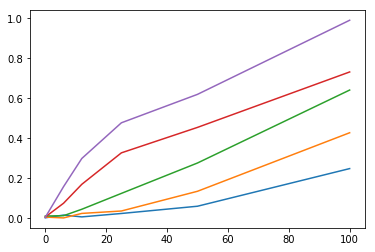

In [83]:
plt.figure()
plt.plot(c,Rgnorm.mean(0).T)

In [84]:
import pickle as pkl
with open('sst_mean_size_contrast.p', 'wb') as handle:
    pkl.dump(Rgnorm.mean(0), handle, protocol=pkl.HIGHEST_PROTOCOL)

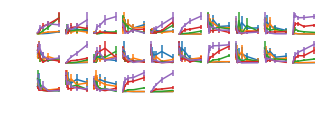

In [65]:
key = keylist[1]
plt.figure(figsize=(10,3))
ut.plot_errorbars_in_rows(c,soriavg[key][ontarget_ret_lax[key]],lb[key][ontarget_ret_lax[key]].mean(1),ub[key][ontarget_ret_lax[key]].mean(1))

(array([  6.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,   1.,   2.,   4.,
          2.,   5.,   1.,   3.,   5.,   5.,   0.,   3.,  35.,   1.,   1.,
          4.,   0.,   0.,   3.,   2.,   4.,   2.,   2.,   1.,   3.,   1.,
          0.,   1.,   1.,   1.,   2.,   0.]),
 array([ 0.        ,  0.1025641 ,  0.20512821,  0.30769231,  0.41025641,
         0.51282051,  0.61538462,  0.71794872,  0.82051282,  0.92307692,
         1.02564103,  1.12820513,  1.23076923,  1.33333333,  1.43589744,
         1.53846154,  1.64102564,  1.74358974,  1.84615385,  1.94871795,
         2.05128205,  2.15384615,  2.25641026,  2.35897436,  2.46153846,
         2.56410256,  2.66666667,  2.76923077,  2.87179487,  2.97435897,
         3.07692308,  3.17948718,  3.28205128,  3.38461538,  3.48717949,
         3.58974359,  3.69230769,  3.79487179,  3.8974359 ,  4.        ]),
 <a list of 39 Patch objects>)

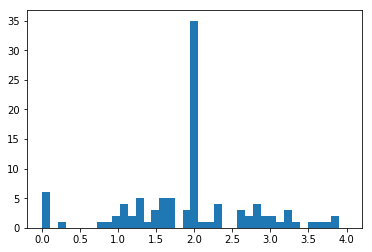

In [45]:
plt.figure()
plt.hist(popt_all[:,-1],bins = np.linspace(0,4,40))

<IPython.core.display.Javascript object>


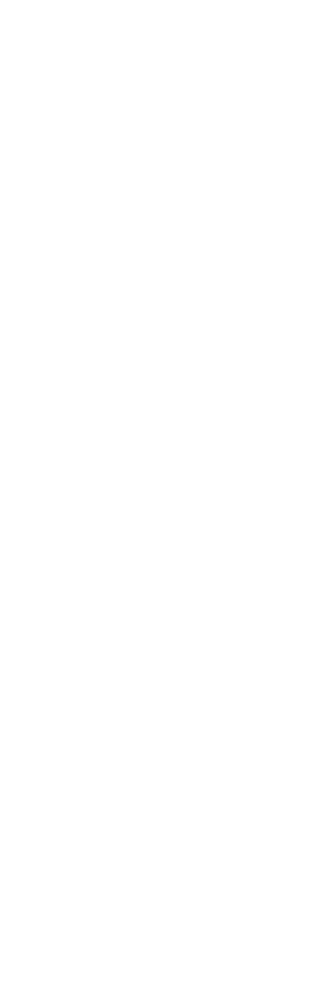

In [243]:
plt.figure(figsize=(8,24))
alpha = 0.3
for k in range(ncells):
    plt.subplot(30,10,k+1)
    r = soriavg[thisfold][k]
    colors = plt.cm.viridis(np.linspace(0,1,nsizes))
    sim = naka_rushton_only_a(c,popt_only_a[k],nsizes)
    for s in range(r.shape[0]):
        plot_errorbar(c,r[s],lb[thisfold][k].mean(0)[s],ub[thisfold][k].mean(0)[s],color=1-alpha*(1-colors[s]))
        plt.axis('off')
    for s in range(r.shape[0]):
        plt.plot(c,sim[s],c=colors[s],linestyle='dashed')

In [236]:
usize = np.logspace(np.log10(5),np.log10(36.5),5)
print(usize)

[  5.           8.21865442  13.50925609  22.20558144  36.5       ]


In [238]:
r.shape

(5, 6)

<IPython.core.display.Javascript object>


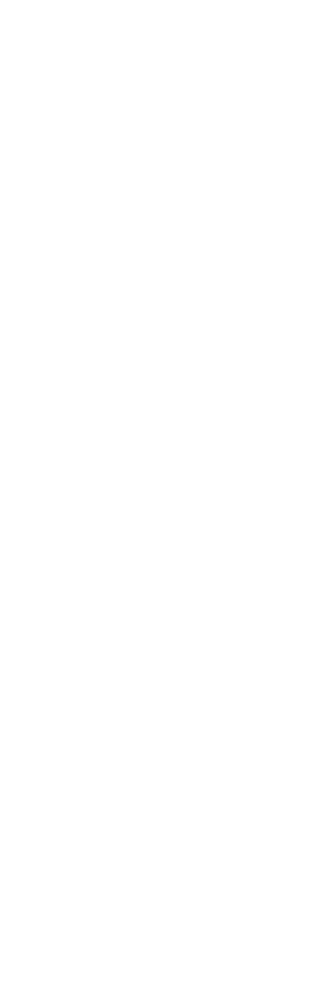

In [242]:
plt.figure(figsize=(8,24))
alpha = 1
for k in range(ncells):
    plt.subplot(30,10,k+1)
    r = soriavg[thisfold][k]
    colors = plt.cm.viridis(np.linspace(0,1,ncontrasts))
#     sim = naka_rushton_only_a(c,popt_only_a[k],nsizes)
    for s in range(r.shape[1]):
        plot_errorbar(usize,r[:,s],lb[thisfold][k].mean(0)[:,s],ub[thisfold][k].mean(0)[:,s],color=1-alpha*(1-colors[s]))
        plt.axis('off')
#     for s in range(r.shape[0]):
#         plt.plot(c,sim[s],c=colors[s],linestyle='dashed')

<IPython.core.display.Javascript object>


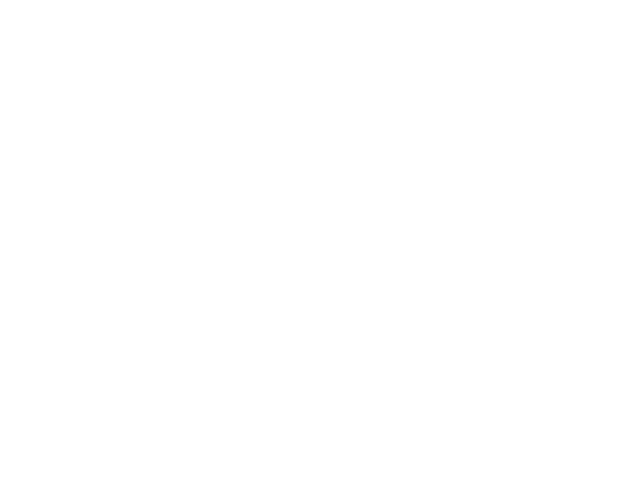

In [207]:
plt.figure()
for k in range(nsizes):
    x = np.linspace(0,1,100)
    a = popt_only_a[:,k] #/(1e-3+popt_all[:,nsizes:nsizes+1]+popt_all[:,:nsizes])
    h,_ = np.histogram(a,bins=x)
    plt.plot(x[:-1],h,color=colors[k])

<IPython.core.display.Javascript object>


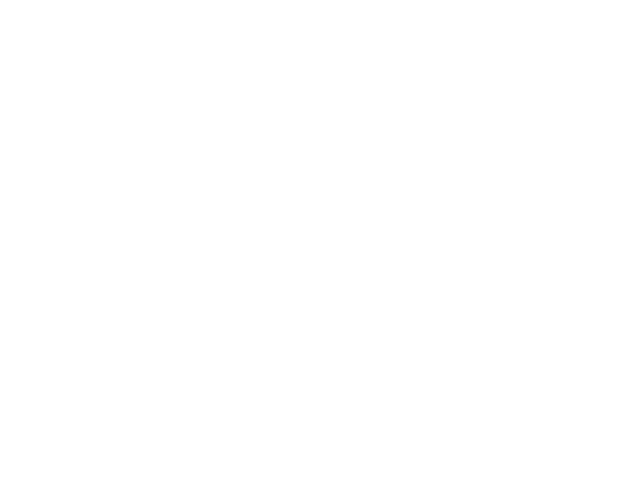

In [228]:
plt.figure()
plt.plot(np.percentile(popt_all[:,:nsizes],25,axis=0))
plt.plot(np.percentile(popt_all[:,:nsizes],50,axis=0))
plt.plot(np.percentile(popt_all[:,:nsizes],75,axis=0))

<IPython.core.display.Javascript object>


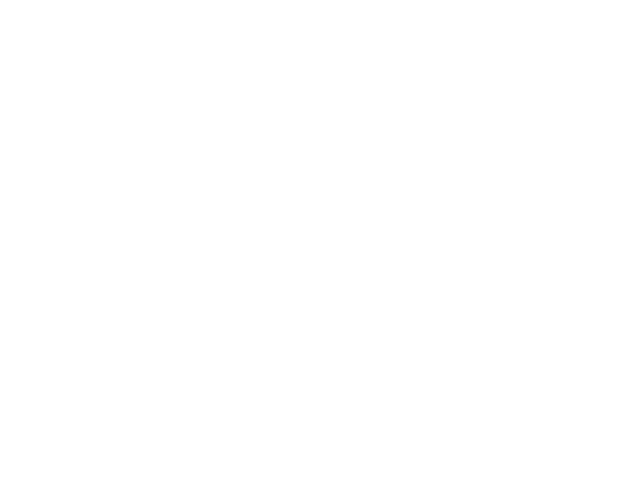

In [229]:
plt.figure()
plt.plot(np.percentile(popt_only_a[:,:nsizes],25,axis=0))
plt.plot(np.percentile(popt_only_a[:,:nsizes],50,axis=0))
plt.plot(np.percentile(popt_only_a[:,:nsizes],75,axis=0))

<IPython.core.display.Javascript object>


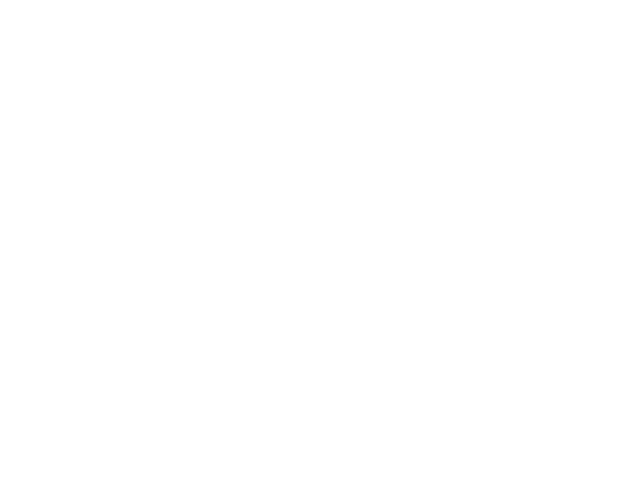

In [227]:
plt.figure()
plt.plot(np.percentile(popt_all,25,axis=0))
plt.plot(np.percentile(popt_all,50,axis=0))
plt.plot(np.percentile(popt_all,75,axis=0))

<IPython.core.display.Javascript object>


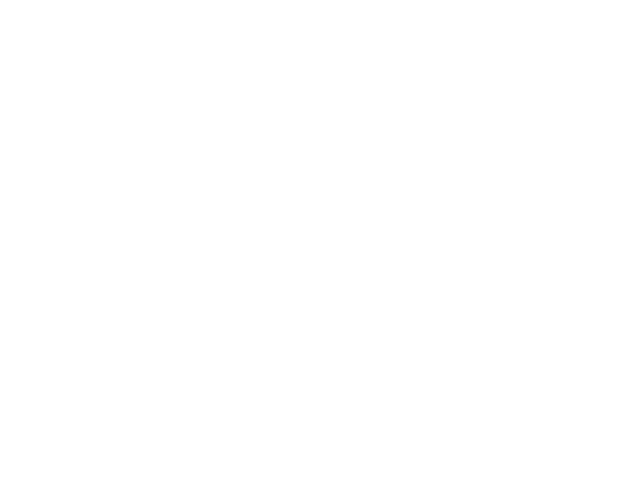

In [226]:
plt.figure()
plt.plot(np.percentile(popt_only_a,50,axis=0))

<IPython.core.display.Javascript object>


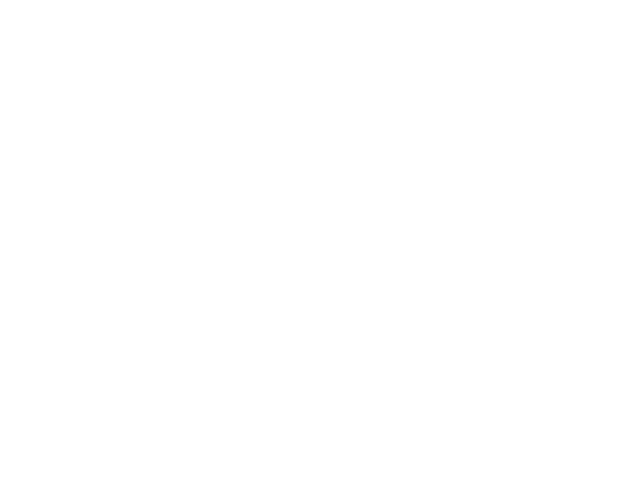

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,
          0.,   0.,   1.,   0.,   0.,   1.,   1.,   1.,   0.,   1.,   1.,
          2.,   1.,   0.,   0.,   1.,   6.,   1.,   4.,   3.,   4.,   4.,
          2.,   8.,   9.,  10.,   8.,   6.,   5.,   1.,   6.,   1.,   3.,
          1.,   4.,   7.,   6.,   2.,   5.,   3.,   9.,   3.,   5.,   4.,
          1.,   2.,   6.,   4.,   4.,   1.,   5.,   3.,   5.,   5.,   6.,
          8.,   9.,   3.,   0.,   2.,   1.,   2.,   2.,   2.,   1.,   3.]),
 array([-3.        , -2.96969697, -2.93939394, -2.90909091, -2.87878788,
        -2.84848485, -2.81818182, -2.78787879, -2.75757576, -2.72727273,
        -2.6969697 , -2.66666667, -2.63636364, -2.60606061, -2.57575758,
        -2.54545455, -2.51515152, -2.48484848, -2.45454545, -2.42424242,
        -2.39393939, -2.36363636, -2.333

In [217]:
plt.figure()
plt.hist(np.log10(popt_only_a[:,-2]/100),bins=np.linspace(-3,0,100))

In [218]:
np.percentile(popt_only_a,50,axis=0)

array([  0.0317938 ,   0.03595231,   0.05249656,   0.08492054,
         0.13056524,   0.04235592,  19.34780635,   1.29463105])

<IPython.core.display.Javascript object>


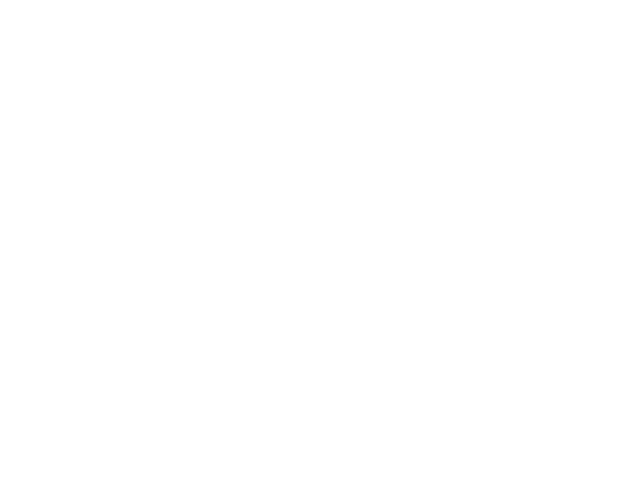

(array([ 15.,   1.,   2.,   1.,   2.,   9.,   3.,   3.,   6.,   5.,  10.,
          5.,   4.,   7.,   7.,   7.,   6.,   3.,   6.,   5.,   5.,   9.,
          5.,   6.,   5.,   7.,   6.,   7.,   6.,   7.,   3.,   6.,   2.,
          3.,   5.,   1.,   4.,   2.,   2.,   5.,   2.,   1.,   1.,   2.,
          2.,   0.,   2.,   0.,   0.,   2.,   2.,   1.,   2.,   1.,   5.,
          0.,   0.,   2.,   1.,   1.,   1.,   0.,   1.,   1.,   0.,   3.,
          1.,   0.,   0.,   0.,   2.,   1.,   0.,   1.,   1.,   0.,   0.,
          0.,   1.,   0.,   0.,   1.,   1.,   1.,   1.,   0.,   0.,   0.,
          0.,   0.,   2.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.]),
 array([ 0.        ,  0.05050505,  0.1010101 ,  0.15151515,  0.2020202 ,
         0.25252525,  0.3030303 ,  0.35353535,  0.4040404 ,  0.45454545,
         0.50505051,  0.55555556,  0.60606061,  0.65656566,  0.70707071,
         0.75757576,  0.80808081,  0.85858586,  0.90909091,  0.95959596,
         1.01010101,  1.06060606,  1.111

In [213]:
plt.figure()
plt.hist(popt_only_a[:,-1],bins=np.linspace(0,5,100))

<IPython.core.display.Javascript object>


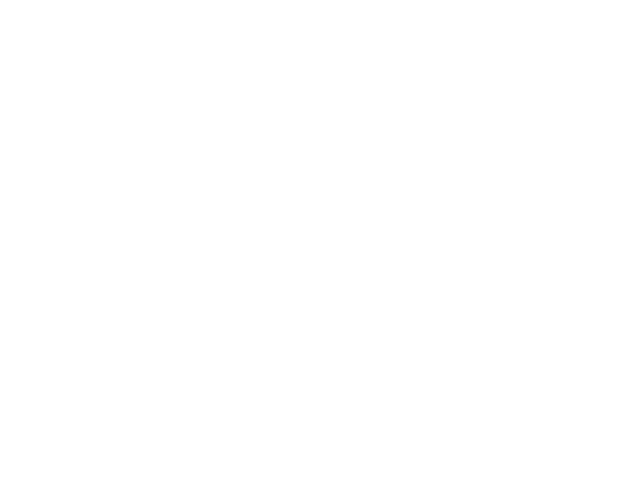

(0, 0.2)

In [199]:
plt.figure()
plt.plot(popt_all[:,:nsizes].T,alpha=0.05)
plt.ylim(0,0.2)

In [ ]:
plt.figure()
for k in range(nsizes):
    x = np.linspace(0,2,100)
    c = popt_all[:,k] #/(1e-3+popt_all[:,nsizes:nsizes+1]+popt_all[:,:nsizes])
    h,_ = np.histogram(a,bins=x)
    plt.plot(x[:-1],h,color=colors[k])

<IPython.core.display.Javascript object>


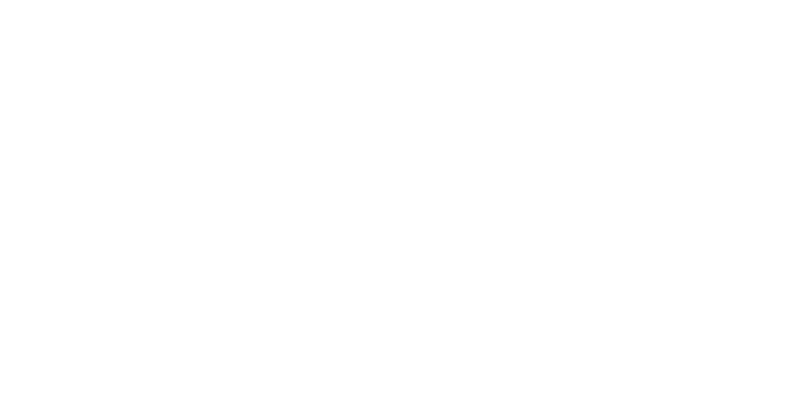

In [191]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.hist(popt_all[:,-1],bins=np.linspace(0,10,100))
plt.subplot(1,2,2)
for k in range(nsizes):
    x = np.linspace(0,100,100)
    h,_ = np.histogram(popt_all[:,-1-nsizes+k],bins=x)
    plt.plot(x[:-1]+0.5,h,color=colors[k])

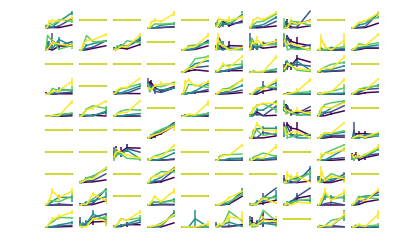

In [32]:
plt.figure()
for k in range(100):
    plt.subplot(10,10,k+1)
    ut.plot_errorbars(np.array((0,0.06,0.12,0.25,0.5,1))*100,soriavg[thisfold][k],lb[thisfold][k].mean(0),ub[thisfold][k].mean(0))
    plt.axis('off')

In [12]:
dcenter = {}
thesefolds = ['180713/M9053/','180714/M9053/']
for thisfold in thesefolds:
    dcenter[thisfold] = ut.dist_from_center(ret[thisfold],5,(0,0))

/home/mossing/Documents/code/adesnal/pyute.py:25: RuntimeWarning: invalid value encountered in true_divide
  return (arr-mnm)/(mxm-mnm)


In [13]:
ontarget = {}
for key in pval.keys():
    ontarget[key] = pval[key].min(1)<0.05/pval[key].shape[1]

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until


In [14]:
pval[thisfold]

array([[ 0.49556232,  0.53607419,  0.42319442,  0.04288807],
       [ 0.10107358,  0.52638366,  0.0601342 ,  0.91276269],
       [ 0.50518729,  0.62030496,  0.6535543 ,  0.08299285],
       ..., 
       [ 0.03858719,  0.02909469,  0.01016386,  0.0021685 ],
       [ 0.19430308,  0.39569837,  0.14921666,  0.09461971],
       [ 0.41806112,  0.02939826,  0.91709278,  0.95899977]])

In [15]:
(ontarget[thisfold]).sum()

87

In [16]:
for key in ontarget.keys():
    print((ontarget[key].sum(),np.logical_not(ontarget[key]).sum()))

(141, 71)
(87, 200)


In [17]:
for key in keylist:
    print(key)

NameError: name 'keylist' is not defined

In [ ]:
list(ontarget.keys())

In [ ]:
plt.figure(figsize=(8,8))

plt.subplot(2,2,1)
keylist = list(ontarget.keys())
for key in keylist:
#     if not key=='180516/M8956':
        vals = soriavg[key][ontarget[key]].copy()
        mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
#         vals = vals/mx
        plt.scatter(vals[:,:,0].mean(1),vals[:,2,-1],s=0.5)        
#         plt.xlim((-0.1,1))
#         plt.ylim((-0.1,1))

plt.subplot(2,2,2)
for key in keylist:
#     if not key=='180516/M8956':
        vals = soriavg[key][ontarget[key]].copy()
        mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
    #     vals = vals/mx
        plt.scatter(vals[:,:,0].mean(1),vals[np.random.permutation(vals.shape[0]),2,-1],s=0.5)        
    #     plt.xlim((-0.1,1))
    #     plt.ylim((-0.1,1))

plt.subplot(2,2,3)
for key in keylist:
#     if not key=='180516/M8956':
        vals = soriavg[key][ontarget[key]].copy()
        mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
        vals = vals/mx
        plt.scatter(vals[:,:,0].mean(1),vals[:,2,-1],s=0.5)        
#         plt.xlim((-0.1,1))
#         plt.ylim((-0.1,1))

plt.subplot(2,2,4)
for key in keylist:
#     if not key=='180516/M8956':
        vals = soriavg[key][ontarget[key]].copy()
        mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
        vals = vals/mx
        plt.scatter(vals[:,:,0].mean(1),vals[np.random.permutation(vals.shape[0]),2,-1],s=0.5)        
    #     plt.xlim((-0.1,1))
    #     plt.ylim((-0.1,1))

In [ ]:
soriavg[keylist[0]].shape

In [ ]:
keylist

In [128]:
# plt.figure()
# XX = np.array(())
# YY = np.array(())
# for key in keylist:
#         vals = soriavg[key][ontarget[key]].copy()
#         mx = 1 #vals.max()[np.newaxis,np.newaxis,np.newaxis]
#         vals = vals/mx
#         xx = vals[:,1,2]
#         yy = vals[:,1,-1]
#         plt.scatter(xx,yy,s=0.5)  # np.random.permutation(vals.shape[0])
#         XX = ut.add_to_array(XX,xx)
#         YY = ut.add_to_array(YY,yy)
# plt.axis('equal')

# matdict = sio.loadmat('updated_vip_sst_60deg_12_100_non_norm.mat')
# matdict['dataZ'] = XX
# matdict['dataW'] = YY
# matdict['labelX'] = 'inferred event rate 0% contrast'
# matdict['labelY'] = 'inferred event rate 100% contrast'
# plt.figure()
# plt.scatter(matdict['dataX'],matdict['dataY'],alpha=1,s=1)
# plt.scatter(matdict['dataZ'],matdict['dataW'],alpha=1,s=1)
# sio.savemat('updated_vip_sst_60deg_12_100_non_norm.mat',matdict)

In [129]:
# plt.figure()
# XX = np.array(())
# YY = np.array(())
# for key in keylist:
#         vals = soriavg[key][ontarget[key]].copy()
#         mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
#         vals = vals/mx
#         xx = vals[:,1,2]
#         yy = vals[:,1,-1]
#         plt.scatter(xx,yy,s=0.5)  # np.random.permutation(vals.shape[0])
#         XX = ut.add_to_array(XX,xx)
#         YY = ut.add_to_array(YY,yy)
# plt.axis('equal')

# matdict = sio.loadmat('updated_vip_sst_60deg_12_100.mat')
# matdict['dataZ'] = XX
# matdict['dataW'] = YY
# matdict['labelX'] = 'inferred event rate 0% contrast'
# matdict['labelY'] = 'inferred event rate 100% contrast'
# plt.figure()
# plt.scatter(matdict['dataX'],matdict['dataY'],alpha=1,s=1)
# plt.scatter(matdict['dataZ'],matdict['dataW'],alpha=1,s=1)
# sio.savemat('updated_vip_sst_60deg_12_100.mat',matdict)

In [130]:
# plt.figure()
# XX = np.array(())
# YY = np.array(())
# for key in keylist:
#         vals = soriavg[key][ontarget[key]].copy()
#         mx = 1#vals.max()[np.newaxis,np.newaxis,np.newaxis]
#         vals = vals/mx
#         plt.scatter(vals[:,:,0].mean(1),vals[:,2,-1],s=0.5)
#         xx = vals[:,:,0].mean(1)
#         yy = vals[:,2,-1]
#         plt.scatter(xx,yy,s=0.5)  # np.random.permutation(vals.shape[0])
#         XX = ut.add_to_array(XX,xx)
#         YY = ut.add_to_array(YY,yy)
        
# matdict = sio.loadmat('updated_pc_vip_15deg_0_100_non_norm.mat')
# matdict['dataZ'] = XX
# matdict['dataW'] = YY
# matdict['labelX'] = 'inferred event rate 0% contrast'
# matdict['labelY'] = 'inferred event rate 100% contrast'
# plt.figure()
# plt.scatter(matdict['dataX'],matdict['dataY'],alpha=1,s=1)
# plt.scatter(matdict['dataZ'],matdict['dataW'],alpha=1,s=1)
# sio.savemat('updated_pc_vip_15deg_0_100_non_norm.mat',matdict)

In [131]:
# plt.figure()
# XX = np.array(())
# YY = np.array(())
# ZZ = np.array(())
# WW = np.array(())
# for key in keylist:
    
#     vals = soriavg[key][ontarget[key]].copy()
#     mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
#     mx = 1
    
#     bd = int(np.cumsum(nbydepth[key])[0])
    
#     vals = soriavg[key][:bd][ontarget[key][:bd]].copy()
#     vals = vals/mx
#     xx = vals[:,:,0].mean(1)
#     yy = vals[:,2,-1]
#     plt.scatter(xx,yy,s=1,c='b')  # np.random.permutation(vals.shape[0])
#     XX = ut.add_to_array(XX,xx)
#     YY = ut.add_to_array(YY,yy)
    
#     bd = int(np.cumsum(nbydepth[key])[2])
    
#     vals = soriavg[key][bd:][ontarget[key][bd:]].copy()
#     vals = vals/mx
#     zz = vals[:,:,0].mean(1)
#     ww = vals[:,2,-1]
#     plt.scatter(zz,ww,s=1,c='r')  # np.random.permutation(vals.shape[0])
#     ZZ = ut.add_to_array(ZZ,zz)
#     WW = ut.add_to_array(WW,ww)

# matdict = {}
# matdict['dataX'] = XX
# matdict['dataY'] = YY
# matdict['dataZ'] = ZZ
# matdict['dataW'] = WW
# matdict['labelX'] = 'inferred event rate 0% contrast'
# matdict['labelY'] = 'inferred event rate 100% contrast'
# plt.figure()
# plt.scatter(matdict['dataX'],matdict['dataY'],s=5)
# sio.savemat('updated_vip_superficial_deep_15deg_0_100_non_norm.mat',matdict)

In [132]:
# plt.figure()
# XX = np.array(())
# YY = np.array(())
# ZZ = np.array(())
# WW = np.array(())
# for key in keylist:
    
#     vals = soriavg[key][ontarget[key]].copy()
#     mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
    
#     bd = int(np.cumsum(nbydepth[key])[0])
    
#     vals = soriavg[key][:bd][ontarget[key][:bd]].copy()
#     vals = vals/mx
#     xx = vals[:,:,0].mean(1)
#     yy = vals[:,2,-1]
#     plt.scatter(xx,yy,s=1,c='b')  # np.random.permutation(vals.shape[0])
#     XX = ut.add_to_array(XX,xx)
#     YY = ut.add_to_array(YY,yy)
    
#     bd = int(np.cumsum(nbydepth[key])[2])
    
#     vals = soriavg[key][bd:][ontarget[key][bd:]].copy()
#     vals = vals/mx
#     zz = vals[:,:,0].mean(1)
#     ww = vals[:,2,-1]
#     plt.scatter(zz,ww,s=1,c='r')  # np.random.permutation(vals.shape[0])
#     ZZ = ut.add_to_array(ZZ,zz)
#     WW = ut.add_to_array(WW,ww)
    
# matdict = {}
# matdict['dataX'] = XX
# matdict['dataY'] = YY
# matdict['dataZ'] = ZZ
# matdict['dataW'] = WW
# matdict['labelX'] = 'inferred event rate 0% contrast'
# matdict['labelY'] = 'inferred event rate 100% contrast'
# plt.figure()
# plt.scatter(matdict['dataX'],matdict['dataY'],s=5)
# sio.savemat('updated_vip_superficial_deep_15deg_0_100.mat',matdict)

In [ ]:
plt.figure()
for key in keylist:
    vals = soriavg[key][ontarget[key]].copy()
    mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
    
    bd = int(np.cumsum(nbydepth[key])[0])
    
    vals = soriavg[key][:bd][ontarget[key][:bd]].copy()
    vals = vals/mx
    plt.scatter(vals[:,:,0].mean(1),vals[:,2,-1],s=1,c='b')
    
    bd = int(np.cumsum(nbydepth[key])[2])
    
    vals = soriavg[key][bd:][ontarget[key][bd:]].copy()
    vals = vals/mx
    plt.scatter(vals[:,:,0].mean(1),vals[:,2,-1],s=1,c='r')

In [ ]:
plt.figure()
for key in pval.keys():
    for i in range(pval[key].shape[0]):
        plt.scatter(np.array((0,1,2,3))+0.1*np.random.randn(4),-np.log10(pval[key][i]),s=1,c='g',alpha=0.5)

In [ ]:
ucontrast = np.array([0,0.06,0.12,0.25,0.5,1])

In [31]:
reload(ut)

<module 'pyute' from '/home/mossing/Documents/code/adesnal/pyute.py'>

In [70]:
def plot_errorbar(x,mn_tgt,lb_tgt,ub_tgt,color='b'):
    errorplus = ub_tgt-mn_tgt
    errorminus = mn_tgt-lb_tgt
    errors = np.concatenate((errorplus[np.newaxis],errorminus[np.newaxis]),axis=0)
    plt.errorbar(x,mn_tgt,yerr=errors,c=color)

In [182]:
list(ontarget.keys())

['180713/M9053/', '180714/M9053/']

In [183]:
keylist = list(ontarget.keys())

In [184]:
centered = {}
for key in keylist:
    centered[key] = dcenter[key]<5

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until


In [218]:
reload(ut)

soriavg_centered = ut.fn_select(soriavg,dcenter,lambda x:x<5)
lb_centered = ut.fn_select(lb,dcenter,lambda x:x<5).mean(1)
ub_centered = ut.fn_select(ub,dcenter,lambda x:x<5).mean(1)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """


In [219]:
off_fn = lambda x: x>10
soriavg_off = ut.fn_select(soriavg,dcenter,off_fn)
lb_off = ut.fn_select(lb,dcenter,off_fn).mean(1)
ub_off = ut.fn_select(ub,dcenter,off_fn).mean(1)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


array([  0.31277286,   0.35448472,   0.46859891,   0.51466158,
         0.55047258,   0.59554179,   0.63289654,   0.65074895,
         0.68758047,   0.76914427,   0.85921128,   0.86274702,
         0.99673847,   1.05909534,   1.06338181,   1.07302014,
         1.10187596,   1.15732427,   1.17743176,   1.18021076,
         1.24575129,   1.29186279,   1.31974601,   1.32362767,
         1.33245686,   1.33413319,   1.35267456,   1.35413176,
         1.35892116,   1.43424773,   1.47392618,   1.4778317 ,
         1.54548277,   1.54944617,   1.56904272,   1.58720797,
         1.59106587,   1.63754341,   1.66837493,   1.68205274,
         1.70276356,   1.70376076,   1.77183542,   1.79582611,
         1.80911267,   1.82583675,   1.82593097,   1.87185538,
         1.89318946,   1.90543411,   1.91552526,   1.93082074,
         1.95654008,   1.96636643,   1.97652573,   2.02004884,
         2.04385026,   2.05970105,   2.06322145,   2.06503242,
         2.06767651,   2.12874952,   2.13016581,   2.13

FileNotFoundError: [Errno 2] No such file or directory: '/home/mossing/modulation/mossing_updates/cdf_of_rf_displacement.pdf'

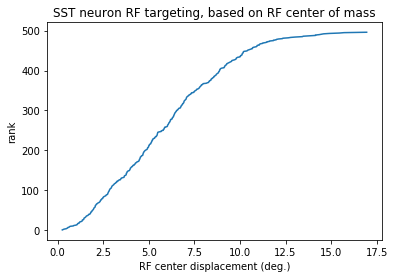

In [19]:
plt.figure()
vals = np.sort(ut.fn_select(dcenter,dcenter,lambda x:np.ones(x.shape,dtype=bool)))
plt.plot(vals,np.arange(vals.shape[0]))
plt.xlabel('RF center displacement (deg.)')
plt.ylabel('rank')
plt.title('SST neuron RF targeting, based on RF center of mass')
plt.axis('tight')
plt.savefig('/home/mossing/modulation/mossing_updates/cdf_of_rf_displacement.pdf')

In [18]:
plt.figure()
plt.imshow(ret[thisfold][thisind])

NameError: name 'thisind' is not defined

In [246]:
retsize = np.zeros((usize.size,)+ret[thisfold].shape[1:])
xx,yy = np.meshgrid(np.arange(-20,25,5),np.arange(-20,25,5))

In [272]:
for i in range(usize.size):
    retsize[i] = np.logical_and(np.abs(xx)<usize[i]/2,np.abs(yy)<usize[i]/2)

<IPython.core.display.Javascript object>


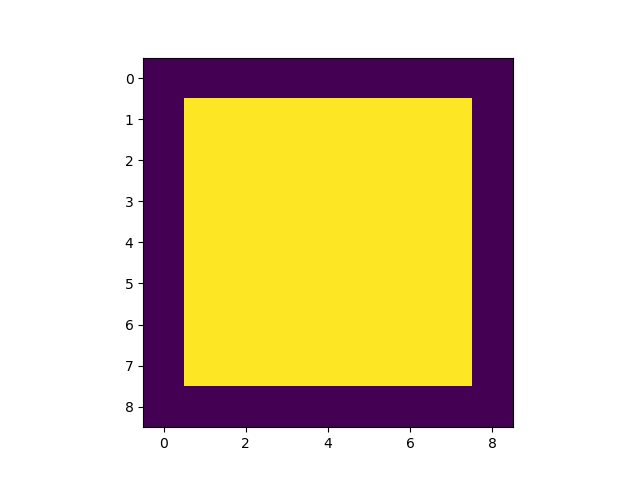

In [275]:
plt.figure()
plt.imshow(retsize[-1])

In [285]:
thisind = 20
modeled = {}
for key in keylist:
    modeled[key] = np.zeros((ret[key].shape[0],usize.size,ucontrast.size))
    for thisind in range(ret[key].shape[0]):
        for i in range(usize.size):
            for j in range(ucontrast.size):
                modeled[key][thisind,i,j] = ucontrast[j]*(ut.norm01(ret[key][thisind],dim=None)*retsize[i]).sum()

/home/mossing/Documents/code/adesnal/pyute.py:24: RuntimeWarning: invalid value encountered in true_divide
  return (arr-mnm)/(mxm-mnm)


In [282]:
x.shape

(6, 5)

<IPython.core.display.Javascript object>


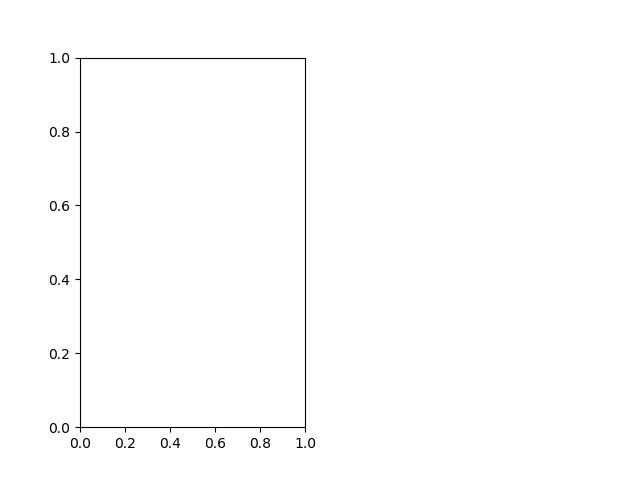

ValueError: x and y must have same first dimension, but have shapes (5,) and (6, 5)

In [284]:
thisind = 60
x = usize #np.tile(usize[np.newaxis],(1,1))
plt.figure()
plt.subplot(1,2,1)
plt.plot(x,modeled.T)
plt.subplot(1,2,2)
plt.plot(x,soriavg[thisfold][thisind].T)

<IPython.core.display.Javascript object>


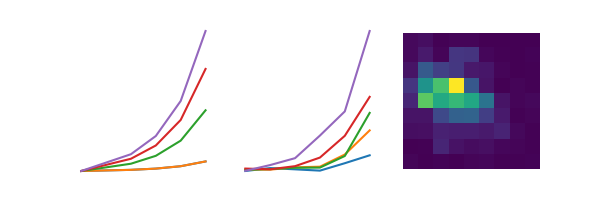

In [303]:
thisfold = '180713/M9053/'
thisind = 50
plt.figure(figsize=(6,2))
plt.subplot(1,3,1)
plt.plot(modeled[thisfold][thisind].T)
plt.axis('off')
plt.subplot(1,3,2)
plt.plot(soriavg[thisfold][thisind].T)
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(ret[thisfold][thisind])
plt.axis('off')
plt.savefig('/home/mossing/modulation/mossing_updates/example_modeled_size_tuning4.pdf')

'180714/M9053/'

In [ ]:
plt.figure()
plot_errorbar()

<IPython.core.display.Javascript object>


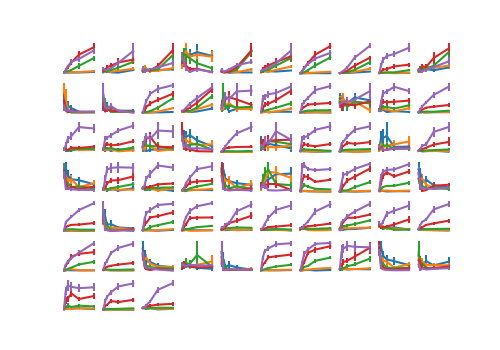

In [220]:
errorbar_in_rows(100*ucontrast,soriavg_off,lb_off,ub_off)

<IPython.core.display.Javascript object>


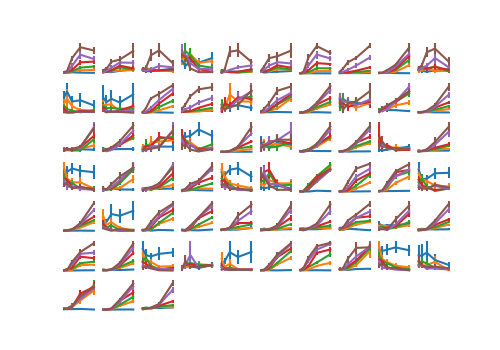

In [235]:
errorbar_in_rows(usize,soriavg_off.transpose((0,2,1)),lb_off.transpose((0,2,1)),ub_off.transpose((0,2,1)))

<IPython.core.display.Javascript object>


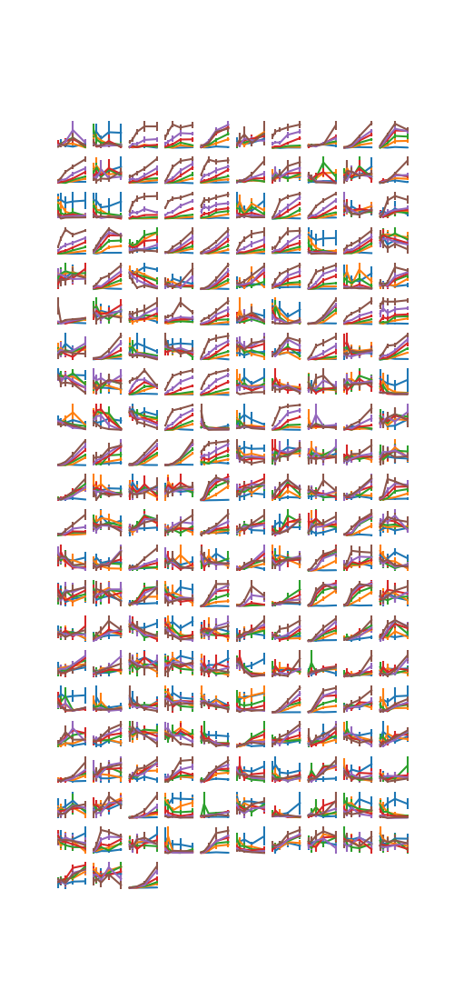

In [236]:
errorbar_in_rows(usize,soriavg_centered.transpose((0,2,1)),lb_centered.transpose((0,2,1)),ub_centered.transpose((0,2,1)))

<IPython.core.display.Javascript object>


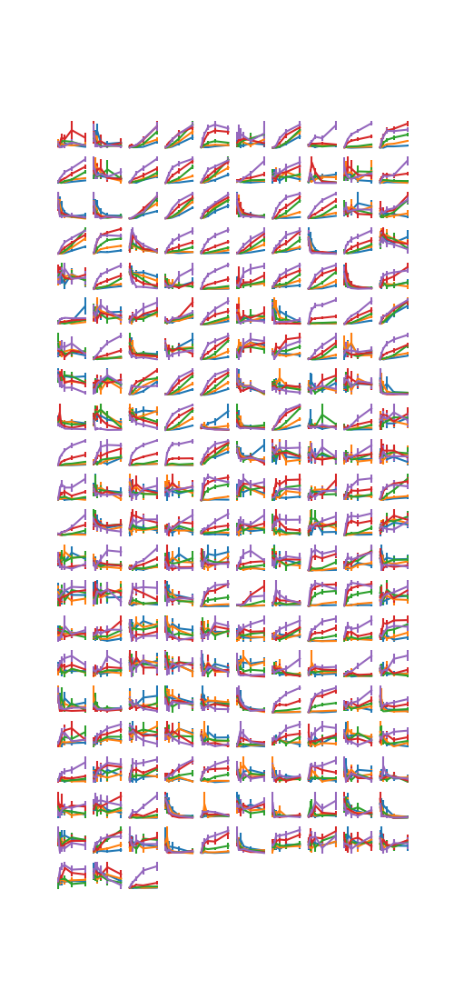

In [212]:
errorbar_in_rows(100*ucontrast,soriavg_centered,lb_centered,ub_centered)

In [ ]:
# def imshow_in_rows(arr,rowlen=10,scale=0.5):
#     nrows = np.ceil(arr.shape[0]/rowlen)
#     plt.figure(figsize=(scale*rowlen,scale*nrows))
#     for k in range(arr.shape[0]):
#         plt.subplot(nrows,rowlen,k+1)
#         plt.imshow(arr[k])
#         plt.axis('off')

In [209]:
def errorbar_in_rows(x,mn,lb,ub,rowlen=10,scale=0.5):
    nrows = np.ceil(mn.shape[0]/rowlen)
    plt.figure(figsize=(scale*rowlen,scale*nrows))
    for k in range(mn.shape[0]):
        plt.subplot(nrows,rowlen,k+1)
        plot_errorbars(x,mn[k],lb[k],ub[k])
        plt.axis('off')

In [210]:
lb_centered.mean(1).shape

(213, 5, 6)

In [211]:
soriavg_centered.shape

(213, 5, 6)

<IPython.core.display.Javascript object>


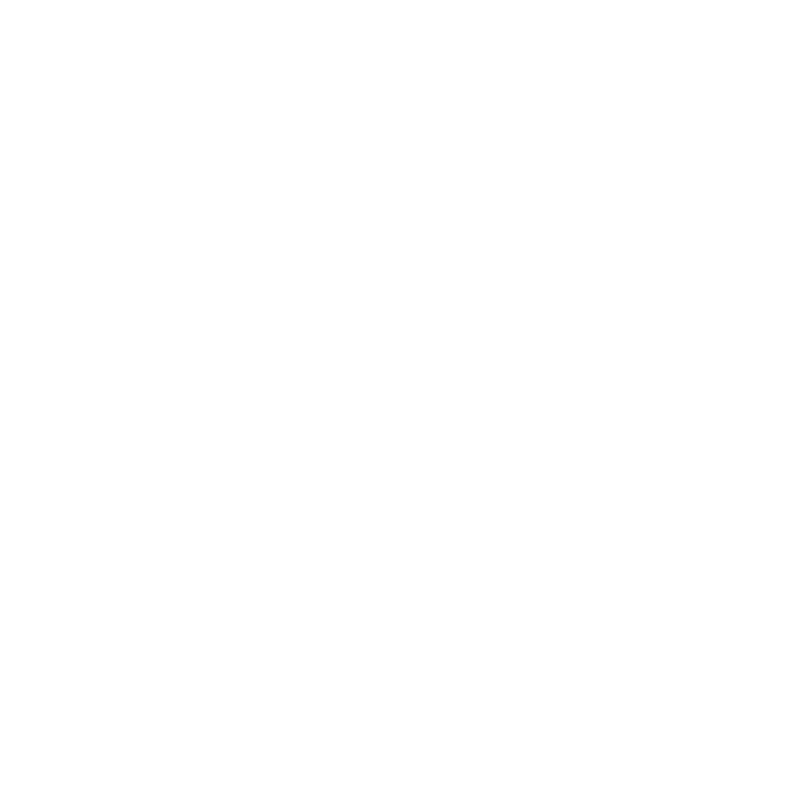

<IPython.core.display.Javascript object>


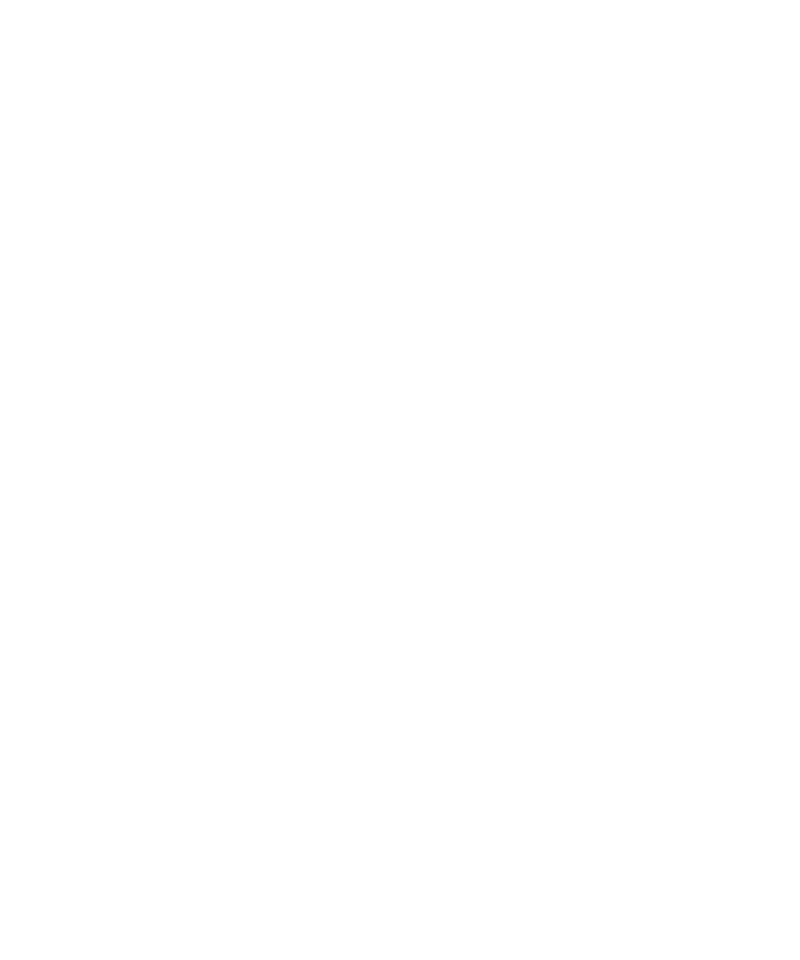

IndexError: index 78 is out of bounds for axis 0 with size 78

In [185]:
for key in keylist:
    grid_dims = np.array((np.ceil(centered[key].sum()/10),10))
    plt.figure(figsize=tuple(0.8*grid_dims[::-1]))
    for k in range(centered[key].sum()):
        plt.subplot(grid_dims[0],grid_dims[1],k+1)
        nvals = soriavg[key].shape[-1]
        plot_errorbars(100*ucontrast[:nvals],soriavg[key][ontarget[key]][k],lb[key][ontarget[key]][k].mean(0),ub[key][ontarget[key]][k].mean(0))
        plt.axis('off')

<IPython.core.display.Javascript object>


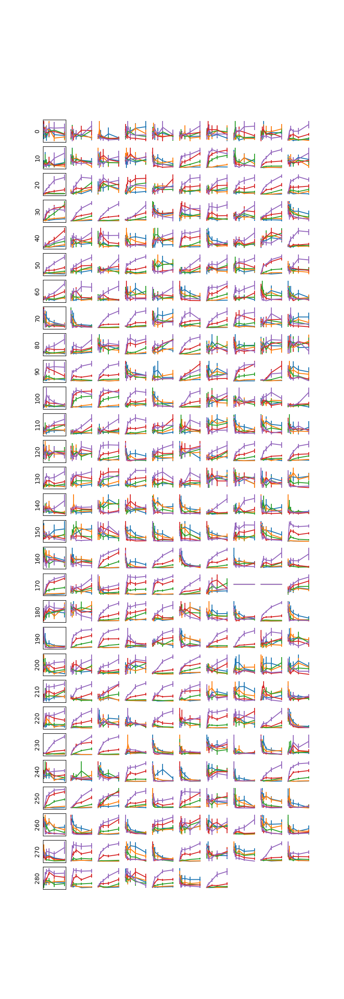

In [140]:
for key in keylist:
    grid_dims = np.array((np.ceil(ontarget[key].size/10),10))
    plt.figure(figsize=tuple(0.8*grid_dims[::-1]))
    for k in range(ontarget[key].size):
        plt.subplot(grid_dims[0],grid_dims[1],k+1)
        nvals = soriavg[key].shape[-1]
        plot_errorbars(100*ucontrast[:nvals],soriavg[key][k],lb[key][k].mean(0),ub[key][k].mean(0))
        plt.axis('off')
        if np.remainder(k,10)==0:
            plt.axis('on')
            plt.ylabel(k)
            plt.xticks([])
            plt.yticks([])

In [141]:
usize = np.logspace(np.log10(5),np.log10(36.5),5)

<IPython.core.display.Javascript object>


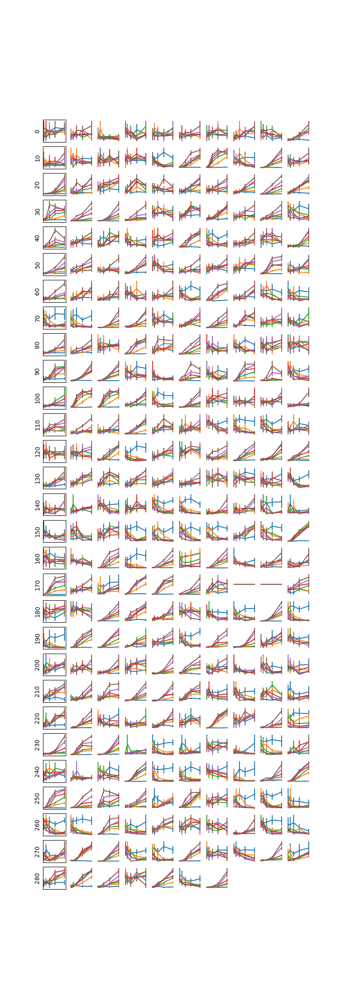

In [142]:
for key in keylist:
    grid_dims = np.array((np.ceil(ontarget[key].size/10),10))
    plt.figure(figsize=tuple(0.8*grid_dims[::-1]))
    for k in range(ontarget[key].size):
        plt.subplot(grid_dims[0],grid_dims[1],k+1)
        nvals = soriavg[key].shape[-2]
        plot_errorbars(100*usize[:nvals],soriavg[key][k].T,lb[key][k].mean(0).T,ub[key][k].mean(0).T)
        plt.axis('off')
        if np.remainder(k,10)==0:
            plt.axis('on')
            plt.ylabel(k)
            plt.xticks([])
            plt.yticks([])

In [143]:
com = np.zeros((ret[thisfold].shape[0],2))
rowlen = 10
nrows = np.ceil(ret[thisfold].shape[0]/rowlen)
for i in range(ret[thisfold].shape[0]):
    com[i] = snm.center_of_mass(ut.norm01(ret[thisfold][i],dim=None))

/home/mossing/Documents/code/adesnal/pyute.py:23: RuntimeWarning: invalid value encountered in true_divide
  return (arr-mnm)/(mxm-mnm)


In [158]:
def dist_from_center(ret,gridsize=5,center=(0,0)):
    com = np.zeros((ret.shape[0],2))
    for i in range(ret[thisfold].shape[0]):
        com[i] = snm.center_of_mass(ut.norm01(ret[i],dim=None))-(ret.shape[1]-1)/2 # center def. as 0,0
    d = gridsize*np.sqrt(np.sum((com-np.array(center))**2,axis=1))
    return d

In [159]:
dcenter = []
thesefolds = ['180713/M9053/','180714/M9053/']
for thisfold in thesefolds:
    dcenter[thisfold] = dist_from_center(ret[thisfold],5,(0,0))

KeyError: '180713/M9053/'

In [160]:
ret.keys()

dict_keys(['180714/M9053/'])

In [146]:
d = 5*np.sqrt((com[:,0]-4)**2+(com[:,1]-4)**2)

In [148]:
near_to_far = np.argsort(d)

<IPython.core.display.Javascript object>


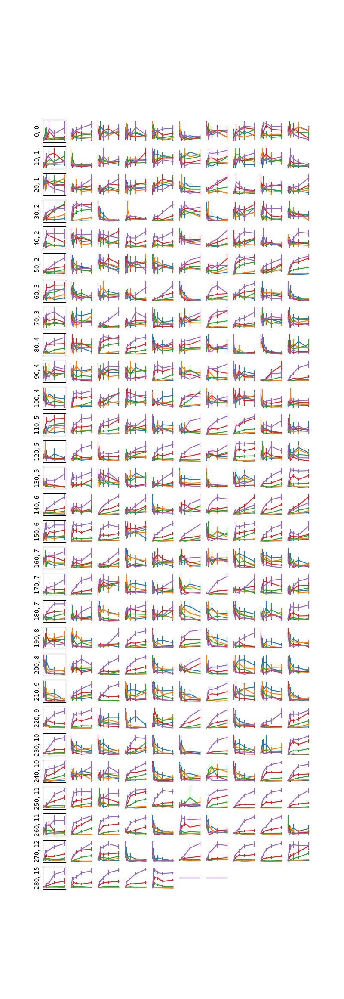

In [151]:
for key in keylist:
    grid_dims = np.array((np.ceil(ontarget[key].size/10),10))
    plt.figure(figsize=tuple(0.8*grid_dims[::-1]))
    for k in range(ontarget[key].size):
        plt.subplot(grid_dims[0],grid_dims[1],k+1)
        nvals = soriavg[key].shape[-1]
        plot_errorbars(100*ucontrast[:nvals],soriavg[key][near_to_far][k],lb[key][near_to_far][k].mean(0),ub[key][near_to_far][k].mean(0))
        plt.axis('off')
        if np.remainder(k,10)==0:
            plt.axis('on')
            plt.ylabel(str(k)+', '+str(int(np.round(d[near_to_far][k]))))
            plt.xticks([])
            plt.yticks([])

<IPython.core.display.Javascript object>


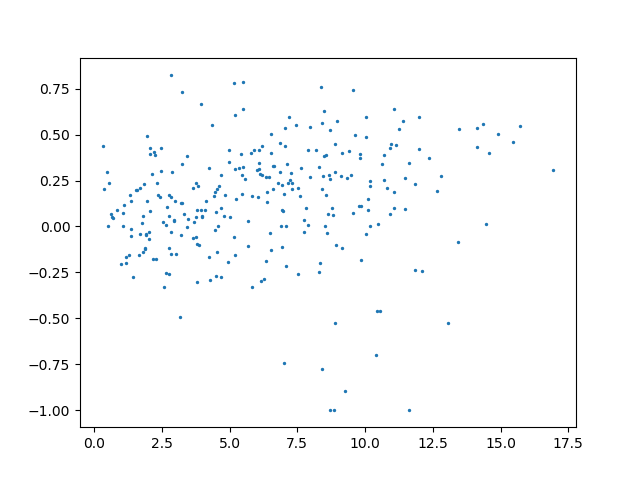

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


In [154]:
plt.figure()
plt.scatter(d,(soriavg[key][:,-1,-1]-soriavg[key][:,-2,-1])/(soriavg[key][:,-1,-1]+soriavg[key][:,-2,-1]),s=2)

<IPython.core.display.Javascript object>


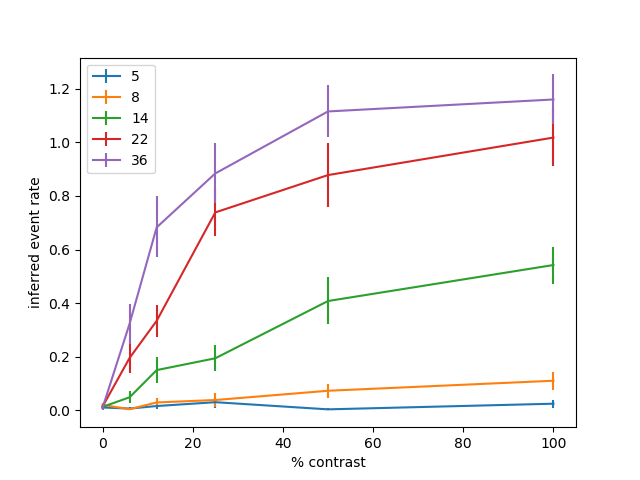

Text(0,0.5,'inferred event rate')

In [70]:
k = 250
plt.figure()
plot_errorbars(100*ucontrast[:nvals],soriavg[key][k],lb[key][k].mean(0),ub[key][k].mean(0))
plt.legend(np.round(np.logspace(np.log10(5),np.log10(36.5),5)).astype('int'))
plt.xlabel('% contrast')
plt.ylabel('inferred event rate')

In [110]:
facilitated = {}
suppressed = {}

for key in keylist:
    suppressed[key] = np.logical_and(ontarget,soriavg[key][:,0,-1]<soriavg[key][:,0,0])
    facilitated[key] = np.logical_and(ontarget,soriavg[key][:,0,-1]>soriavg[key][:,0,0])

In [111]:
s36 = soriavg.copy()
for key in keylist:
    if s36[key].shape[1]==5:
        s36[key] = s36[key][:,::2]

In [114]:
s36[keylist[2]].shape

(941, 3, 6)

In [115]:
def concatenate_by_key(d_val,d_ind,keys):
    to_return = np.array(())
    for key in keys:
        vals = d_val[key]
        inds = d_ind[key].astype('bool')
        if to_return.shape[0]:
            to_return = np.concatenate((to_return,vals[inds]))
        else:
            to_return = vals[inds]
        return to_return

In [116]:
soriavg[keylist[-1]].shape

(941, 3, 6)

In [117]:
s_supp = concatenate_by_key(s36,suppressed,keylist)
s_fac = concatenate_by_key(s36,facilitated,keylist)

In [118]:
def plot_bootstrapped_errorbars(x,arr,axis=0):
    lb,ub = ut.bootstrap(arr,np.mean,axis=axis,pct=(16,84))
    mn = arr.mean(axis)
    plot_errorbars(x,mn,lb,ub)

In [119]:
s_supp.shape

(42, 3, 6)

In [120]:
s_fac.shape

(248, 3, 6)

<IPython.core.display.Javascript object>


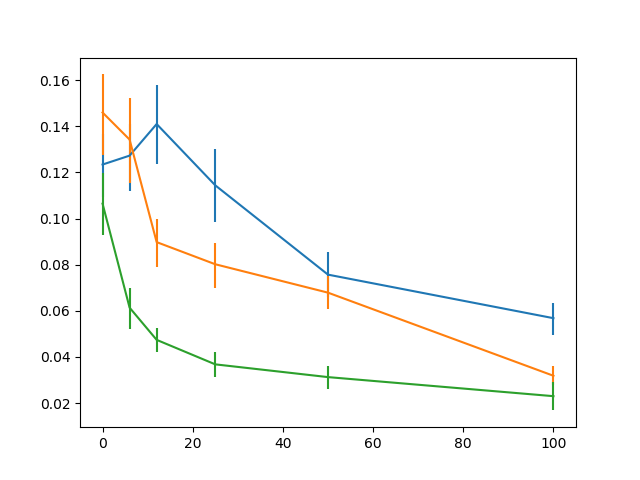

In [121]:
plt.figure()
plot_bootstrapped_errorbars(100*ucontrast,s_supp,axis=0)

<IPython.core.display.Javascript object>


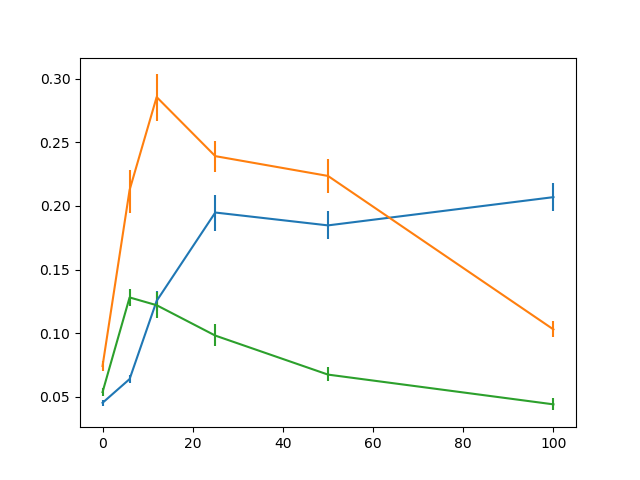

In [122]:
plt.figure()
plot_bootstrapped_errorbars(100*ucontrast,s_fac,axis=0)

In [140]:
keylist_scatter = list(soriavg.keys())
for key in keylist_scatter:
    print(key)
keylist_scatter.remove(keylist_scatter[3])

180412/M7955/
180516/M8956/
180528/M8959/
180531/M8961/
180618/M8956/
180321/M7955/


In [141]:
np.linspace(5,36.5,5)

array([  5.   ,  12.875,  20.75 ,  28.625,  36.5  ])

In [150]:
keylist_scatter

['180412/M7955/',
 '180516/M8956/',
 '180528/M8959/',
 '180618/M8956/',
 '180321/M7955/']

In [304]:
# blcutoff = 1
# ds = 10
# blspan = 3000
# nbefore = 4
# nafter = 4
# def gen_trialwise(datafiles,blcutoff=blcutoff,blspan=blspan,frame_adjust=None): #nbefore=nbefore,nafter=nafter
#     trialwise = np.array(())
#     ctrialwise = np.array(())
#     strialwise = np.array(())
#     try:
#         for datafile in datafiles:
#             frm = sio.loadmat(datafile.replace('.rois','.mat'),squeeze_me=True)['info']['frame'][()][1:]
#             if frame_adjust:
#                 frm = frame_adjust(frm)
#             to_add = sio.loadmat(datafile,squeeze_me=True)['corrected']
#     #         baseline = np.percentile(to_add,blcutoff,axis=1)
#             baseline = sfi.percentile_filter(to_add[:,::ds],blcutoff,(1,int(blspan/ds)))
#             baseline = np.repeat(baseline,ds,axis=1)
#     #         if baseline.shape[1]<to_add.shape[1]:
#     #             baseline = np.hstack((baseline,np.repeat(baseline[:,-1],to_add.shape[1]-baseline.shape[1])))
#             if baseline.shape[1]>to_add.shape[1]:
#                 baseline = baseline[:,:to_add.shape[1]]
#             c = np.zeros_like(to_add)
#             s = np.zeros_like(to_add)
#             for i in range(c.shape[0]):
#     #                 dfof = (to_add[i]-baseline[i,np.newaxis])/baseline[i,np.newaxis]
#                 dfof = (to_add[i]-baseline[i,:])/baseline[i,:]
#                 c[i],s[i],_,_,_  = deconvolve(dfof,penalty=1)
#             to_add = ut.trialize(to_add,frm,nbefore,nafter)
#             c = ut.trialize(c,frm,nbefore,nafter)
#             s = ut.trialize(s,frm,nbefore,nafter)
#             try:
#                 trialwise = np.concatenate((trialwise,to_add),axis=0)
#                 ctrialwise = np.concatenate((ctrialwise,c),axis=0)
#                 strialwise = np.concatenate((strialwise,s),axis=0)
#             except:
#                 trialwise = to_add.copy()
#                 ctrialwise = np.concatenate((ctrialwise,c),axis=0)
#                 strialwise = np.concatenate((strialwise,s),axis=0)
#     except:
#         for datafile in datafiles:
#             frm = sio.loadmat(datafile.replace('.rois','.mat'),squeeze_me=True)['info']['frame'][()][1:]
#             if frame_adjust:
#                 frm = frame_adjust(frm)
#             with h5py.File(datafile,mode='r') as f:
#                 to_add = f['corrected'][:].T
#                 to_add[np.isnan(to_add)] = 0
#     #             baseline = np.percentile(to_add,blcutoff,axis=1)
#                 baseline = sfi.percentile_filter(to_add[:,::ds],blcutoff,(1,int(blspan/ds)))
#                 baseline = np.repeat(baseline,ds,axis=1)
#                 for i in range(baseline.shape[0]):
#                     baseline[i] = sfi.gaussian_filter1d(baseline[i],blspan/2)
#     #             if baseline.shape[1]<to_add.shape[1]:
#     #                 baseline = np.hstack((baseline,np.repeat(baseline[:,-1],to_add.shape[1]-baseline.shape[1])))
#                 if baseline.shape[1]>to_add.shape[1]:
#                     baseline = baseline[:,:to_add.shape[1]]
#                 c = np.zeros_like(to_add)
#                 s = np.zeros_like(to_add)
#                 dfof = np.zeros_like(to_add)
#                 for i in range(c.shape[0]):
#     #                 dfof = (to_add[i]-baseline[i,np.newaxis])/baseline[i,np.newaxis]
#                     dfof[i] = (to_add[i]-baseline[i,:])/baseline[i,:]
#                     try:
#                         c[i],s[i],_,_,_  = deconvolve(dfof[i],penalty=1,sn=5e-3)
#                     except:
# #                         throwaway = 0
#                         print("in "+datafile+" couldn't do "+str(i))
#                 to_add_temp = ut.trialize(dfof,frm,nbefore,nafter)
#                 ctemp = ut.trialize(c,frm,nbefore,nafter)
#                 stemp = ut.trialize(s,frm,nbefore,nafter)
#                 try:
#                     trialwise = np.concatenate((trialwise,to_add_temp),axis=0)
#                     ctrialwise = np.concatenate((ctrialwise,ctemp),axis=0)
#                     strialwise = np.concatenate((strialwise,stemp),axis=0)
# #                     print(to_add.shape)
#                 except:
#                     trialwise = to_add_temp.copy()
#                     ctrialwise = ctemp.copy()
#                     strialwise = stemp.copy()
#     return trialwise,ctrialwise,strialwise

In [305]:
# def get_nbydepth(datafiles):
#     nbydepth = np.zeros((len(datafiles),))
#     for i,datafile in enumerate(datafiles):
#         with h5py.File(datafile,mode='r') as f:
#             nbydepth[i] = (f['corrected'][:].T.shape[0])
#     return nbydepth

In [307]:
#     def gen_traces(datafiles,blcutoff=blcutoff,blspan=blspan): #nbefore=nbefore,nafter=nafter
#         trialwise = np.array(())
#         ctrialwise = np.array(())
#         strialwise = np.array(())
#         dfofall = np.array(())
#         baselineall = np.array(())
#         for datafile in datafiles:
#             frm = sio.loadmat(datafile.replace('.rois','.mat'),squeeze_me=True)['info']['frame'][()][1:]
#             with h5py.File(datafile,mode='r') as f:
#                 to_add = f['corrected'][:].T
#                 to_add[np.isnan(to_add)] = 0
#     #             baseline = np.percentile(to_add,blcutoff,axis=1)
#                 baseline = sfi.percentile_filter(to_add[:,::ds],blcutoff,(1,int(blspan/ds)))
#                 baseline = np.repeat(baseline,ds,axis=1)
#                 for i in range(baseline.shape[0]):
#                     baseline[i] = sfi.gaussian_filter1d(baseline[i],blspan/2)
#     #             if baseline.shape[1]<to_add.shape[1]:
#     #                 baseline = np.hstack((baseline,np.repeat(baseline[:,-1],to_add.shape[1]-baseline.shape[1])))
#                 if baseline.shape[1]>to_add.shape[1]:
#                     baseline = baseline[:,:to_add.shape[1]]
#                 c = np.zeros_like(to_add)
#                 s = np.zeros_like(to_add)
#                 dfof = np.zeros_like(to_add)
#                 for i in range(c.shape[0]):
#     #                 dfof = (to_add[i]-baseline[i,np.newaxis])/baseline[i,np.newaxis]
#                     dfof[i] = (to_add[i]-baseline[i,:])/baseline[i,:]
#                     try:
#                         c[i],s[i],_,_,_  = deconvolve(dfof[i],penalty=1,sn=5e-3)
#                     except:
# #                         throwaway = 0
#                         print("in "+datafile+" couldn't do "+str(i))
#                 try:
#                     trialwise = np.concatenate((trialwise,to_add),axis=0)
#                     ctrialwise = np.concatenate((ctrialwise,c),axis=0)
#                     strialwise = np.concatenate((strialwise,s),axis=0)
#                     dfofall = np.concatenate((dfofall,dfof),axis=0)
#                     baselineall = np.concatenate((baselineall,baseline),axis=0)
#                 except:
#                     trialwise = to_add.copy()
#                     ctrialwise = c.copy()
#                     strialwise = s.copy()
#                     dfofall = dfof.copy()
#                     baselineall = baseline.copy()
#         return trialwise,ctrialwise,strialwise,dfofall,baselineall

In [308]:
# def analyze_size_contrast(datafiles,stimfile,retfile=None,frame_adjust=None):
#     nbydepth = get_nbydepth(datafiles)
# #     trialwise,ctrialwise,strialwise = gen_trialwise(datafiles,frame_adjust=frame_adjust)
#     trialwise,ctrialwise,strialwise,dfof = ut.gen_precise_trialwise(datafiles,rg=(1,0),frame_adjust=frame_adjust,nbefore=nbefore,nafter=nafter)
#     zstrialwise = sst.zscore(strialwise.reshape((strialwise.shape[0],-1)).T).T.reshape(strialwise.shape)
    
#     result = sio.loadmat(stimfile,squeeze_me=True)['result'][()]
    
#     infofile = sio.loadmat(datafiles[0][:-12]+'.mat',squeeze_me=True) # original .mat file
#     frame = infofile['info'][()]['frame'][()][1:]
#     if frame_adjust:
#         frame = frame_adjust(frame)
    
#     data = strialwise #[:,:,nbefore:-nafter]
    
#     try:
#         dxdt = sio.loadmat(datafiles[1],squeeze_me=True)['dxdt']
#     except:
#         with h5py.File(datafiles[1],mode='r') as f:
#             dxdt = f['dxdt'][:].T
            
#     trialrun = np.zeros(frame[0::2].shape)
#     for i in range(len(trialrun)):
#         trialrun[i] = dxdt[frame[0::2][i]:frame[1::2][i]].mean()
#     runtrial = trialrun>0#>100
    
#     pval = np.zeros(strialwise.shape[0])
#     for i in range(strialwise.shape[0]):
#         _,pval[i] = sst.ttest_rel(data[i,:,nbefore-1],data[i,:,nbefore+1])
        
#     stimparams = result['stimParams']
        
#     indexlut,stimp = np.unique(stimparams,axis=1,return_inverse=True)
    
#     angle = stimparams[0]
#     size = stimparams[1]
#     contrast = stimparams[4]
    
#     ucontrast = np.unique(contrast)
#     uangle = np.unique(angle)
#     usize = np.unique(size)
#     ncontrast = len(ucontrast)
#     nangle = len(uangle)
#     nsize = len(usize)
    
#     angle180 = np.remainder(angle,180)
#     uangle180 = np.unique(angle180)
#     nangle180 = len(uangle180)
    
#     Smean = np.zeros((data.shape[0],nangle180,nsize,ncontrast,data.shape[2]))
#     Stavg = np.zeros((data.shape[0],nangle180,nsize,ncontrast,int(data.shape[1]/nangle/nsize/ncontrast)))
    
#     Strials = {}
#     Sspont = {}
#     for i in range(nangle180):
#         for j in range(nsize):
#             for k in range(ncontrast):
#                 lkat = np.logical_and(runtrial,np.logical_and(angle180==uangle180[i],np.logical_and(size==usize[j],contrast==ucontrast[k])))
#                 Smean[:,i,j,k,:] = data[:,lkat,:].mean(1)
#                 Strials[(i,j,k)] = data[:,lkat,nbefore:-nafter].mean(2)
#                 Sspont[(i,j,k)] = data[:,lkat,:nbefore].mean(2)
    
#     lb = np.zeros((strialwise.shape[0],nangle180,nsize,ncontrast))
#     ub = np.zeros((strialwise.shape[0],nangle180,nsize,ncontrast))
#     # mn = np.zeros((strialwise.shape[0],nangle180,nsize,ncontrast))
    
#     for i in range(nangle180):
#         print(i)
#         for j in range(nsize):
#             for k in range(ncontrast):
#                 lb[:,i,j,k],ub[:,i,j,k] = ut.bootstrap(Strials[(i,j,k)],np.mean,axis=1,pct=(16,84))
#                 # mn[:,i,j,k] = np.nanmean(Strials[(i,j,k)],axis=1)
    
#     pval = np.zeros((strialwise.shape[0],nangle180))
# #     for i in range(pval.shape[0]):
# #         print(i)
#     for j,theta in enumerate(uangle180):
#         print(theta)
#         _,pval[:,j] = sst.ttest_rel(Sspont[(j,2,ncontrast-1)],Strials[(j,2,ncontrast-1)],axis=1)
                
#     Savg = np.nanmean(np.nanmean(Smean[:,:,:,:,nbefore:-nafter],axis=-1),axis=1)
    
#     Storiavg = Stavg.mean(1)
#     # _,pval = sst.ttest_ind(Storiavg[:,0,-1].T,Storiavg[:,0,0].T)
    
#     #suppressed = np.logical_and(pval<0.05,Savg[:,0,-1]<Savg[:,0,0])
#     #facilitated = np.logical_and(pval<0.05,Savg[:,0,-1]>Savg[:,0,0])
    
#     return Savg,Smean,lb,ub,pval

In [2]:
# folds = []

In [311]:
# def analyze_everything(folds,files,rets,adjust_fns):
#     soriavg = {}
#     strialavg = {}
#     lb = {}
#     ub = {}
#     pval = {}
#     nbydepth = {}
#     datafoldbase = '/home/mossing/scratch/2Pdata/'
#     stimfoldbase = '/home/mossing/scratch/visual_stim/'
#     for thisfold,thisfile,retnumber,frame_adjust in zip(folds,files,rets,adjust_fns):
#         datafold = datafoldbase+thisfold+'ot/'
#         datafiles = [thisfile+'_ot_'+number+'.rois' for number in ['000','001','002','003']]

#         stimfold = stimfoldbase+thisfold
#         stimfile = thisfile+'.mat'

#         datafiles = [datafold+file for file in datafiles]
#         stimfile = stimfold+stimfile
#         retfile = datafoldbase+thisfold+'retinotopy_'+retnumber+'.mat'

#         nbefore = 4
#         nafter = 4

#         soriavg[thisfold],strialavg[thisfold],lb[thisfold],ub[thisfold],pval[thisfold] = analyze_size_contrast(datafiles,stimfile,retfile,frame_adjust)
#         nbydepth[thisfold] = get_nbydepth(datafiles)
#         ret[thisfold] = sio.loadmat(retfile,squeeze_me=True)['ret'][:]
#     return soriavg,strialavg,lb,ub,pval,nbydepth,ret